### **This test case will use UCF101 Action Recognition Data Set to verify:**

*    the performance of **TTFS-phase encoder Scheme**.



**Setup**

Begin by installing and importing some necessary libraries, including: remotezip to inspect the contents of a ZIP file, tqdm to use a progress bar, OpenCV to process video files, einops for performing more complex tensor operations, and tensorflow_docs for embedding data in a Jupyter notebook

In [ ]:
!pip install remotezip tqdm opencv-python einops
!pip install tensorflow keras

In [ ]:
import tqdm
import random
import pathlib
import itertools
import collections

import cv2
import einops
import numpy as np
import remotezip as rz
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
import keras
from keras import layers
import time

In [ ]:
import keras
from keras.models import Sequential
from keras.datasets import mnist
from keras.layers import Dense
from keras import initializers
from keras.regularizers import l2
from keras.layers import Flatten
from keras.layers import Conv1D
from keras.layers import Dropout
from keras.optimizers import Adam
#because of multiclass datasets
from tensorflow.keras import utils
import random

**Load and preprocess video data**

The hidden cell below defines helper functions to download a slice of data from the UCF-101 dataset, and load it into a tf.data.Dataset. You can learn more about the specific preprocessing steps in the Loading video data tutorial, which walks you through this code in more detail.

The FrameGenerator class at the end of the hidden block is the most important utility here. It creates an iterable object that can feed data into the TensorFlow data pipeline. Specifically, this class contains a Python generator that loads the video frames along with its encoded label. The generator (__call__) function yields the frame array produced by frames_from_video_file and a one-hot encoded vector of the label associated with the set of frames.

In [ ]:
import tensorflow as tf
import numpy as np

def TTFS_Phase_Encoder(video, time_steps=20, SMO_freq=5000, TMAX=295):
    """
    TTFS-Phase Encoder: aligns TTFS spike times with oscillatory phase cycles (SMO).

    Args:
        video: np.array or tf.Tensor of shape (frames, H, W, C), values in [0,1].
        time_steps: Number of discrete time steps to encode over.
        SMO_freq: Oscillation frequency in Hz (phase alignment frequency).
        TMAX: Maximum simulation time in ms (defines SMO phase range).

    Returns:
        spikes: tf.Tensor of shape (time_steps, frames, H, W, C)
            Binary spike trains indicating spike events over time.
    """
    # --- Ensure input is float tensor ---
    video = tf.convert_to_tensor(video, dtype=tf.float32)
    frames = tf.shape(video)[0]
    H = tf.shape(video)[1]
    W = tf.shape(video)[2]
    C = tf.shape(video)[3]

    # --- Step 1: Compute initial TTFS spike times ---
    spike_times = (1.0 - video) * (time_steps - 1)  # brighter pixel → earlier spike
    spike_times = tf.round(spike_times)

    # --- Step 2: Phase alignment ---
    spike_times_np = spike_times.numpy()

    # Generate SMO phase time grid (oscillation times)
    SMO_interval = 1000.0 / SMO_freq
    SMO_times = np.arange(0, TMAX - 0.1, SMO_interval)

    # Align each pixel's spike time to the next SMO time
    flat = spike_times_np.flatten()
    for i in range(flat.shape[0]):
        for sm in SMO_times:
            if sm >= flat[i]:
                flat[i] = sm
                break

    spike_times_aligned = flat.reshape(spike_times_np.shape)

    # --- Step 3: Normalize back into simulation time window [0, time_steps) ---
    spike_times_aligned = np.mod(spike_times_aligned, time_steps - 1)

    # --- Step 4: Generate binary spike train ---
    time_range = tf.range(time_steps, dtype=tf.float32)[:, None, None, None, None]
    spikes = tf.cast(tf.equal(time_range, spike_times_aligned[None, ...]), tf.float32)

    return spikes


In [ ]:
# Codes from Source 1: Video classification with a 3D convolutional neural network
# https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/video/video_classification.ipynb#scrollTo=L2MHy42s5wl6

def list_files_per_class(zip_url):
  """
    List the files in each class of the dataset given the zip URL.

    Args:
      zip_url: URL from which the files can be unzipped.

    Return:
      files: List of files in each of the classes.
  """
  files = []
  with rz.RemoteZip(URL) as zip:
    for zip_info in zip.infolist():
      files.append(zip_info.filename)
  return files

def get_class(fname):
  """
    Retrieve the name of the class given a filename.

    Args:
      fname: Name of the file in the UCF101 dataset.

    Return:
      Class that the file belongs to.
  """
  return fname.split('_')[-3]

def get_files_per_class(files):
  """
    Retrieve the files that belong to each class.

    Args:
      files: List of files in the dataset.

    Return:
      Dictionary of class names (key) and files (values).
  """
  files_for_class = collections.defaultdict(list)
  for fname in files:
    class_name = get_class(fname)
    files_for_class[class_name].append(fname)
  return files_for_class

def download_from_zip(zip_url, to_dir, file_names):
  """
    Download the contents of the zip file from the zip URL.

    Args:
      zip_url: Zip URL containing data.
      to_dir: Directory to download data to.
      file_names: Names of files to download.
  """
  with rz.RemoteZip(zip_url) as zip:
    for fn in tqdm.tqdm(file_names):
      class_name = get_class(fn)
      zip.extract(fn, str(to_dir / class_name))
      unzipped_file = to_dir / class_name / fn

      fn = pathlib.Path(fn).parts[-1]
      output_file = to_dir / class_name / fn
      unzipped_file.rename(output_file,)

def split_class_lists(files_for_class, count):
  """
    Returns the list of files belonging to a subset of data as well as the remainder of
    files that need to be downloaded.

    Args:
      files_for_class: Files belonging to a particular class of data.
      count: Number of files to download.

    Return:
      split_files: Files belonging to the subset of data.
      remainder: Dictionary of the remainder of files that need to be downloaded.
  """
  split_files = []
  remainder = {}
  for cls in files_for_class:
    split_files.extend(files_for_class[cls][:count])
    remainder[cls] = files_for_class[cls][count:]
  return split_files, remainder

def download_ufc_101_subset(zip_url, num_classes, splits, download_dir):
  """
    Download a subset of the UFC101 dataset and split them into various parts, such as
    training, validation, and test.

    Args:
      zip_url: Zip URL containing data.
      num_classes: Number of labels.
      splits: Dictionary specifying the training, validation, test, etc. (key) division of data
              (value is number of files per split).
      download_dir: Directory to download data to.

    Return:
      dir: Posix path of the resulting directories containing the splits of data.
  """
  files = list_files_per_class(zip_url)
  for f in files:
    tokens = f.split('/')
    if len(tokens) <= 2:
      files.remove(f) # Remove that item from the list if it does not have a filename

  files_for_class = get_files_per_class(files)

  classes = list(files_for_class.keys())[:num_classes]

  for cls in classes:
    new_files_for_class = files_for_class[cls]
    random.shuffle(new_files_for_class)
    files_for_class[cls] = new_files_for_class

  # Only use the number of classes you want in the dictionary
  files_for_class = {x: files_for_class[x] for x in list(files_for_class)[:num_classes]}

  dirs = {}
  for split_name, split_count in splits.items():
    print(split_name, ":")
    split_dir = download_dir / split_name
    split_files, files_for_class = split_class_lists(files_for_class, split_count)
    download_from_zip(zip_url, split_dir, split_files)
    dirs[split_name] = split_dir

  return dirs

def format_frames(frame, output_size):
  """
    Pad and resize an image from a video.

    Args:
      frame: Image that needs to resized and padded.
      output_size: Pixel size of the output frame image.

    Return:
      Formatted frame with padding of specified output size.
  """
  frame = tf.image.convert_image_dtype(frame, tf.float32)
  frame = tf.image.resize_with_pad(frame, *output_size)
  return frame

def frames_from_video_file(video_path, n_frames, output_size = (50,50), frame_step = 15):
  """
    Creates frames from each video file present for each category.

    Args:
      video_path: File path to the video.
      n_frames: Number of frames to be created per video file.
      output_size: Pixel size of the output frame image.

    Return:
      An NumPy array of frames in the shape of (n_frames, height, width, channels).
  """
  # Read each video frame by frame
  result = []
  src = cv2.VideoCapture(str(video_path))

  video_length = src.get(cv2.CAP_PROP_FRAME_COUNT)

  need_length = 1 + (n_frames - 1) * frame_step

  if need_length > video_length:
    start = 0
  else:
    max_start = int(video_length - need_length)
    start = random.randint(0, int(max_start + 1)) # Cast to int


  src.set(cv2.CAP_PROP_POS_FRAMES, start)
  # ret is a boolean indicating whether read was successful, frame is the image itself
  ret, frame = src.read()
  if ret:
      # Convert frame to grayscale
      gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
      # Reshape to add a channel dimension for consistency with later operations
      gray_frame = np.expand_dims(gray_frame, axis=-1)
      result.append(format_frames(gray_frame, output_size))
  else:
      # Append a black frame if read fails
      result.append(np.zeros((*output_size, 1), dtype=np.float32)) # Use 1 channel for grayscale


  for _ in range(n_frames - 1):
    for _ in range(frame_step):
      ret, frame = src.read()
    if ret:
      # Convert frame to grayscale
      gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
      # Reshape to add a channel dimension
      gray_frame = np.expand_dims(gray_frame, axis=-1)
      result.append(format_frames(gray_frame, output_size))
    else:
      # Append a black frame if read fails
      result.append(np.zeros_like(result[0]))
  src.release()
  # result = np.array(result)[..., [2, 1, 0]] # Removed BGR to RGB conversion as now grayscale

  return np.array(result)

class FrameGenerator:
  def __init__(self, path, n_frames, training = False):
    """ Returns a set of frames with their associated label.

      Args:
        path: Video file paths.
        n_frames: Number of frames.
        training: Boolean to determine if training dataset is being created.
    """
    self.path = path
    self.n_frames = n_frames
    self.training = training
    self.class_names = sorted(set(p.name for p in self.path.iterdir() if p.is_dir()))
    self.class_ids_for_name = dict((name, idx) for idx, name in enumerate(self.class_names))

  def get_files_and_class_names(self):
    video_paths = list(self.path.glob('*/*.avi'))
    classes = [p.parent.name for p in video_paths]
    return video_paths, classes

  def __call__(self):
    video_paths, classes = self.get_files_and_class_names()

    pairs = list(zip(video_paths, classes))

    if self.training:
      random.shuffle(pairs)

    for path, name in pairs:
      # Load frames as float32 and normalized in [0, 1]
      video_frames = frames_from_video_file(path, self.n_frames)
      video_frames = tf.cast(video_frames, tf.float32)
      video_frames = tf.clip_by_value(video_frames, 0.0, 1.0)

      # Encode using ISI
      spikes = TTFS_Phase_Encoder(video_frames, time_steps=self.n_frames)

      label = self.class_ids_for_name[name]

      # Yield spike-encoded data instead of raw frames
      yield spikes, label

In [ ]:
URL = 'https://storage.googleapis.com/thumos14_files/UCF101_videos.zip'
download_dir = pathlib.Path('./UCF101_subset/')
subset_paths = download_ufc_101_subset(URL,
                        num_classes = 10,
                        splits = {"train": 30, "val": 10, "test": 10},
                        download_dir = download_dir)

train :


100%|██████████| 300/300 [06:00<00:00,  1.20s/it]


val :


100%|██████████| 100/100 [01:46<00:00,  1.06s/it]


test :


100%|██████████| 100/100 [02:27<00:00,  1.48s/it]


##### **Source:** Video classification with a 3D convolutional neural network
**Create the training, validation, and test sets (train_ds, val_ds, and test_ds).**

**Purpose:** See below for the codes to create the training, validation, and test sets (train_ds, val_ds, and test_ds).



In [ ]:
n_frames = 10
batch_size = 8
output_size = (50, 50) # Define output_size here as it's used in output_signature
num_of_classes = 10 # Define num_of_classes here as it's used in one_hot encoding

# The output signature should match the shape of the data yielded by the generator
# The generator yields TTFS encoded data with shape (time_steps, frames, H, W, C)
# where time_steps = n_frames and frames = n_frames
output_signature = (
    tf.TensorSpec(shape=(n_frames, n_frames, output_size[0], output_size[1], 1), dtype=tf.float32),
    tf.TensorSpec(shape=(), dtype=tf.int64)
)

# Create FrameGenerators
train_gen = FrameGenerator(subset_paths['train'], n_frames, training=True)
val_gen = FrameGenerator(subset_paths['val'], n_frames)
#commented out by hongqian since /test subfolder does not exist
test_gen = FrameGenerator(subset_paths['test'], n_frames)

# Create tf.data.Datasets from the generators
# The generator already outputs TTFS encoded data, so no need to call TTFS_Phase_Encoder in map
train_ds = tf.data.Dataset.from_generator(
    lambda: train_gen(), output_signature=output_signature)
# Apply one-hot encoding to labels and batch, cache, prefetch
train_ds_encoded = train_ds.map(lambda frames, labels: (frames, tf.one_hot(labels, num_of_classes))).batch(batch_size).cache().prefetch(buffer_size=tf.data.AUTOTUNE)
#print("train_ds_encoded hongqian: ")
#print(list(train_ds_encoded))


val_ds = tf.data.Dataset.from_generator(
    lambda: val_gen(), output_signature=output_signature)
# Apply one-hot encoding to labels and batch, cache, prefetch
val_ds_encoded = val_ds.map(lambda frames, labels: (frames, tf.one_hot(labels, num_of_classes))).batch(batch_size).cache().prefetch(buffer_size=tf.data.AUTOTUNE)

test_ds = tf.data.Dataset.from_generator(
    lambda: test_gen(), output_signature=output_signature)
# Apply one-hot encoding to labels and batch, cache, prefetch
test_ds_encoded = test_ds.map(lambda frames, labels: (frames, tf.one_hot(labels, num_of_classes))).batch(batch_size).cache().prefetch(buffer_size=tf.data.AUTOTUNE)

### **Classification Training Model - Conv3D Video Classification**

In [ ]:
#Rate encoding limited num neural network model definition
from keras.layers import Conv3D, MaxPooling3D, InputLayer, Reshape, Lambda
import tensorflow as tf

def create_model():
  model = Sequential()
  # Explicitly add an InputLayer
  # The input shape should be (time_steps, frames, H, W, C) without the batch size
  # Corrected input_shape for grayscale (1 channel)
  model.add(InputLayer(input_shape=(n_frames, n_frames, output_size[0], output_size[1], 1)))

  # model.add(Lambda(lambda x: tf.print("Shape after InputLayer:", tf.shape(x))))
  # Reshape the input to combine frames and channels for Conv3D
  # New shape will be (time_steps, H, W, frames * C)
  # Corrected Reshape target shape for grayscale (1 channel)
  model.add(Reshape((n_frames, output_size[0], output_size[1], n_frames * 1))) # Reshape to (time_steps, H, W, frames*channels)

  # Add 3D convolutional layers to process video data
  # Now Conv3D operates on (time_steps, H, W, frames*channels)
  model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', padding='same')) # Added padding for consistent spatial dimensions
  model.add(MaxPooling3D(pool_size=(1, 2, 2))) # Pool over spatial dimensions

  model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', padding='same'))
  model.add(MaxPooling3D(pool_size=(1, 2, 2)))

  model.add(Conv3D(128, kernel_size=(3, 3, 3), activation='relu', padding='same'))
  model.add(MaxPooling3D(pool_size=(1, 2, 2)))

  model.add(Flatten()) # Flatten the output of convolutional layers
  # Add Dense layers
  model.add(Dense(128, activation='relu'))
  model.add(Dropout(0.5)) # Add dropout for regularization
  model.add(Dense(num_of_classes, activation='softmax'))
  model.compile(Adam(learning_rate=0.0001), # Adjusted learning rate
                loss='categorical_crossentropy',
               metrics=['accuracy'])
  return model

# Assuming x_train, y_train, x_test, y_test are available from previous steps if needed for printing shapes
# print(np.mean(x_train), np.std(x_train))

In [ ]:
#!!!Run this block of code and all below

model = create_model()
print(model.summary())

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ (None, 10, 50, 50, 10) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d (Conv3D)                 │ (None, 10, 50, 50, 32) │         8,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 10, 25, 25, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 10, 25, 25, 64) │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 10, 12, 12, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_2 (Conv3D)               │ (None, 10, 12, 12,     │       221,312 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 10, 6, 6, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 46080)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     5,898,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,185,002 (23.59 MB)

 Trainable params: 6,185,002 (23.59 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
T0 = time.time()

history = model.fit(
    train_ds_encoded,       # 👈 use encoded dataset
    validation_data=val_ds_encoded,  # 👈 same here
    epochs=100,
    verbose=1
)

T1 = time.time()
Train_T = T1 - T0
print(f"Training time: {Train_T:.2f} seconds")


Epoch 1/100
     38/Unknown 110s 3s/step - accuracy: 0.0878 - loss: 2.4181

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


38/38 ━━━━━━━━━━━━━━━━━━━━ 146s 4s/step - accuracy: 0.0886 - loss: 2.4162 - val_accuracy: 0.2500 - val_loss: 2.2495
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.1445 - loss: 2.2343 - val_accuracy: 0.3300 - val_loss: 2.1380
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.2012 - loss: 2.0850 - val_accuracy: 0.3000 - val_loss: 2.0682
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.3375 - loss: 1.9832 - val_accuracy: 0.2800 - val_loss: 2.0015
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.3178 - loss: 1.9207 - val_accuracy: 0.3300 - val_loss: 1.9336
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.3863 - loss: 1.7868 - val_accuracy: 0.3200 - val_loss: 1.9120
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.3154 - loss: 1.8925 - val_accuracy: 0.3900 - val_loss: 1.8300
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4186 - loss: 1.6824 - val_accuracy: 0.4300 - val_l

In [ ]:
test_loss, test_acc = model.evaluate(test_ds_encoded)
print(f"Test Accuracy: {test_acc:.4f}")

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5957 - loss: 2.2980
Test Accuracy: 0.6200


In [ ]:
# Inspect the shape of data from the training dataset
for frames, labels in train_ds.take(1):
  print("Shape of frames batch:", frames.shape)
  print("Shape of labels batch:", labels.shape)

Shape of frames batch: (10, 10, 50, 50, 1)
Shape of labels batch: ()


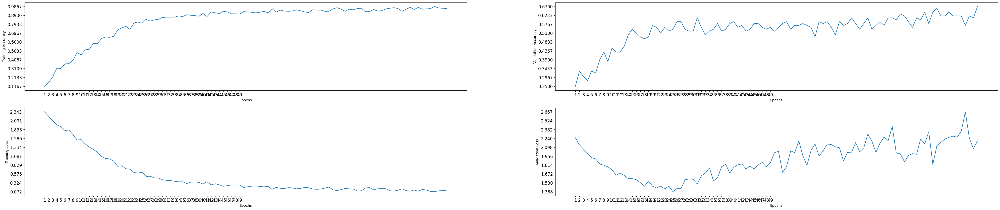

In [ ]:
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (50, 10) )
train_x = range(1, len(history.history["accuracy"])+1)
train_y = history.history["accuracy"]
train_loss = history.history["loss"]
ax[0,0].plot(train_x, train_y)
ax[0,0].set_xlabel("Epochs")
ax[0,0].set_ylabel("Training Accuracy")
ax[0,0].set_xticks(range(1, 50))
ax[0,0].tick_params(axis = "both", labelsize = 12)
ax[0,0].set_yticks(np.linspace(start = min(train_y), stop = max(train_y), num = 10))

val_x = range(1, len(history.history["val_accuracy"])+1)
val_y = history.history["val_accuracy"]
ax[0,1].plot(val_x , val_y)
ax[0,1].set_xlabel("Epochs")
ax[0,1].set_ylabel("Validation Accuracy")
ax[0,1].set_xticks(range(1, 50))
ax[0,1].set_yticks(np.linspace(start = min(val_y), stop = max(val_y), num = 10))
ax[0,1].tick_params(axis = "both", labelsize = 12)

train_loss = history.history["loss"]
ax[1,0].plot(train_x, train_loss)
ax[1,0].set_xlabel("Epochs")
ax[1,0].set_ylabel("Training Loss")
ax[1,0].set_xticks(range(1, 50))
ax[1,0].tick_params(axis = "both", labelsize = 12)
ax[1,0].set_yticks(np.linspace(start = min(train_loss), stop = max(train_loss), num = 10))

val_loss = history.history["val_loss"]
ax[1,1].plot(train_x, val_loss)
ax[1,1].set_xlabel("Epochs")
ax[1,1].set_ylabel("Validation Loss")
ax[1,1].set_xticks(range(1, 50))
ax[1,1].tick_params(axis = "both", labelsize = 12)
ax[1,1].set_yticks(np.linspace(start = min(val_loss), stop = max(val_loss), num = 10))

plt.show()

## **Optonal Validation **- Validate the Train_ds_encoded shape and data for the first 2 frames in the first vedio.

In [ ]:
for video, label in train_ds_encoded.take(1):
    print("Video tensor data (first 2 frames):")
    # Slice the video tensor to include only the first 2 frames (index 0 and 1)
    print(video[:, :, :8, :, :, :])
    print("\nLabel tensor data:")
    print(label)

Video tensor data (first 2 frames):
tf.Tensor(
[[[[[[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    ...

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]]


   [[[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    ...

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]]


   [[[1.]
     [1.]
     [1.]
     ...
     [1.]
     [1.]
     [1.]]

    [[1.

In [ ]:
for frames, label in train_ds.take(1):
    print("Raw frames shape:", frames.shape)
    print("Label:", label.numpy())

for spikes, label in train_ds_encoded.take(2):
    # The shape after TTFS encoding and batching is (batch_size, time_steps, frames, H, W, C)
    print("TTFS encoded shape:", spikes.shape)
    print("Label one-hot shape:", label.shape)

    # Apply TTFS encoding and one-hot encoding, then batch and prefetch the datasets
# The TTFS_Phase_Encoder function outputs data in the shape (time_steps, frames, H, W, C)
# When batched, the shape becomes (batch_size, time_steps, frames, H, W, C)
# This is the correct input shape for the Conv3D layers, so no further flattening is needed.

Raw frames shape: (10, 10, 50, 50, 1)
Label: 8
TTFS encoded shape: (8, 10, 10, 50, 50, 1)
Label one-hot shape: (8, 10)
TTFS encoded shape: (8, 10, 10, 50, 50, 1)
Label one-hot shape: (8, 10)


# **Optional Validation**

a) List of calasses (10), b) List of downloaded video files and c) a sample of the video file & frames

In [ ]:
# a) Create a FrameGenerator instance for one of the datasets (e.g., training)
# You can use any of the paths from subset_paths dictionary
example_gen = FrameGenerator(subset_paths['train'], n_frames)

# Access and print the class names
print(example_gen.class_names)


['ApplyEyeMakeup', 'ApplyLipstick', 'Archery', 'BabyCrawling', 'BalanceBeam', 'BandMarching', 'BaseballPitch', 'Basketball', 'BasketballDunk', 'BenchPress']


In [ ]:
# b) list of downloaded video files
print(download_dir)
!ls -R {download_dir}


UCF101_subset
UCF101_subset:
test  train  val

UCF101_subset/test:
ApplyEyeMakeup	Archery       BalanceBeam   BaseballPitch  BasketballDunk
ApplyLipstick	BabyCrawling  BandMarching  Basketball	   BenchPress

UCF101_subset/test/ApplyEyeMakeup:
UCF101			      v_ApplyEyeMakeup_g07_c04.avi
v_ApplyEyeMakeup_g01_c03.avi  v_ApplyEyeMakeup_g10_c03.avi
v_ApplyEyeMakeup_g02_c03.avi  v_ApplyEyeMakeup_g15_c06.avi
v_ApplyEyeMakeup_g04_c07.avi  v_ApplyEyeMakeup_g21_c02.avi
v_ApplyEyeMakeup_g05_c06.avi  v_ApplyEyeMakeup_g21_c04.avi
v_ApplyEyeMakeup_g06_c05.avi

UCF101_subset/test/ApplyEyeMakeup/UCF101:

UCF101_subset/test/ApplyLipstick:
UCF101			     v_ApplyLipstick_g15_c01.avi
v_ApplyLipstick_g03_c03.avi  v_ApplyLipstick_g19_c02.avi
v_ApplyLipstick_g04_c01.avi  v_ApplyLipstick_g23_c03.avi
v_ApplyLipstick_g05_c02.avi  v_ApplyLipstick_g24_c05.avi
v_ApplyLipstick_g06_c05.avi  v_ApplyLipstick_g25_c02.avi
v_ApplyLipstick_g10_c04.avi

UCF101_subset/test/ApplyLipstick/UCF101:

UCF101_subset/test/Archery:
U

Playing video: UCF101_subset/val/BaseballPitch/v_BaseballPitch_g17_c01.avi


array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 22,  26,  28],
        [ 12,  16,  18],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 46,  50,  52],
        [ 35,  39,  41],
        [  9,  13,  15]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 65,  69,  71],
        [ 55,  59,  61],
        [ 29,  33,  35]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [108, 156, 108],
        [127, 171, 124],
        [ 59, 103,  56]],

       [[128, 102,  88],
        [128, 102,  88],
        [128, 102,  88],
        ...,
        [109, 157, 109],
        [128, 172, 125],
        [ 60, 104,  57]],

       [[ 90,  64,  50],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 45,  93,  45],
        [ 65, 109,  62],
        [  0,  41,   0]]], dtype=uint8)
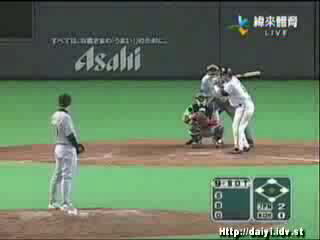

array([[  2,   2,   2, ...,  25,  15,   0],
       [ 24,  24,  24, ...,  49,  38,  12],
       [ 42,  42,  42, ...,  68,  58,  32],
       ...,
       [109, 109, 109, ..., 136, 152,  84],
       [108, 108, 108, ..., 137, 153,  85],
       [ 70,  70,  70, ...,  73,  90,  24]], dtype=uint8)
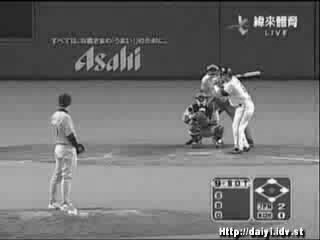

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 22,  26,  28],
        [ 12,  16,  18],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 46,  50,  52],
        [ 35,  39,  41],
        [  9,  13,  15]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 65,  69,  71],
        [ 55,  59,  61],
        [ 29,  33,  35]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [108, 156, 108],
        [127, 171, 124],
        [ 59, 103,  56]],

       [[128, 102,  88],
        [128, 102,  88],
        [128, 102,  88],
        ...,
        [109, 157, 109],
        [128, 172, 125],
        [ 60, 104,  57]],

       [[ 90,  64,  50],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 45,  93,  45],
        [ 65, 109,  62],
        [  0,  41,   0]]], dtype=uint8)
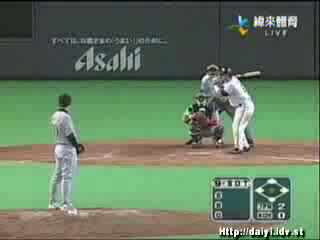

array([[  2,   2,   2, ...,  25,  15,   0],
       [ 24,  24,  24, ...,  49,  38,  12],
       [ 42,  42,  42, ...,  68,  58,  32],
       ...,
       [109, 109, 109, ..., 136, 152,  84],
       [108, 108, 108, ..., 137, 153,  85],
       [ 70,  70,  70, ...,  73,  90,  24]], dtype=uint8)
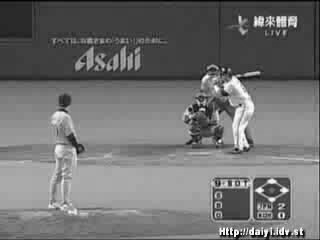

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 22,  26,  28],
        [ 12,  16,  18],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 46,  50,  52],
        [ 35,  39,  41],
        [  9,  13,  15]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 65,  69,  71],
        [ 55,  59,  61],
        [ 29,  33,  35]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[128, 102,  88],
        [128, 102,  88],
        [128, 102,  88],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
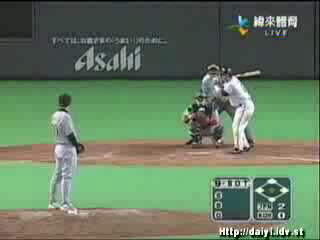

array([[  2,   2,   2, ...,  25,  15,   0],
       [ 24,  24,  24, ...,  49,  38,  12],
       [ 42,  42,  42, ...,  68,  58,  32],
       ...,
       [109, 109, 109, ..., 139, 156,  80],
       [108, 108, 108, ..., 141, 157,  81],
       [ 70,  70,  70, ...,  77,  94,  22]], dtype=uint8)
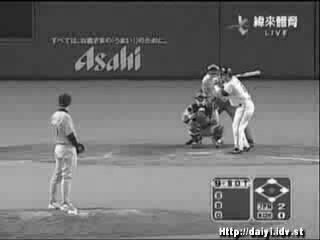

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 22,  26,  28],
        [ 12,  16,  18],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 46,  50,  52],
        [ 35,  39,  41],
        [  9,  13,  15]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 65,  69,  71],
        [ 55,  59,  61],
        [ 29,  33,  35]],

       ...,

       [[131, 105,  91],
        [131, 105,  91],
        [131, 105,  91],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[130, 104,  90],
        [130, 104,  90],
        [130, 104,  90],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 92,  66,  52],
        [ 92,  66,  52],
        [ 92,  66,  52],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
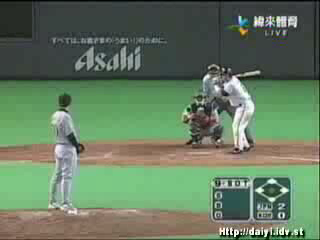

array([[  2,   2,   2, ...,  25,  15,   0],
       [ 24,  24,  24, ...,  49,  38,  12],
       [ 42,  42,  42, ...,  68,  58,  32],
       ...,
       [111, 111, 111, ..., 139, 156,  80],
       [110, 110, 110, ..., 141, 157,  81],
       [ 72,  72,  72, ...,  77,  94,  22]], dtype=uint8)
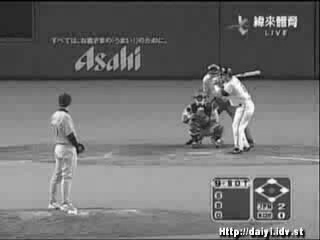

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 22,  26,  28],
        [ 12,  16,  18],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 46,  50,  52],
        [ 35,  39,  41],
        [  9,  13,  15]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 65,  69,  71],
        [ 55,  59,  61],
        [ 29,  33,  35]],

       ...,

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[131, 105,  91],
        [131, 105,  91],
        [131, 105,  91],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 93,  67,  53],
        [ 93,  67,  53],
        [ 93,  67,  53],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
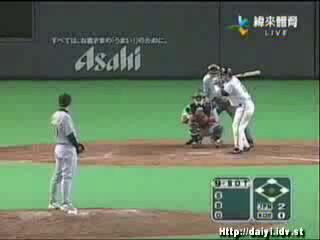

array([[  2,   2,   2, ...,  25,  15,   0],
       [ 24,  24,  24, ...,  49,  38,  12],
       [ 42,  42,  42, ...,  68,  58,  32],
       ...,
       [113, 113, 113, ..., 139, 156,  80],
       [111, 111, 111, ..., 141, 157,  81],
       [ 73,  73,  73, ...,  77,  94,  22]], dtype=uint8)
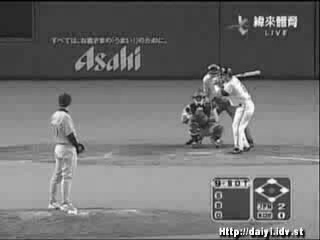

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[131, 105,  91],
        [131, 105,  91],
        [131, 105,  91],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 93,  67,  53],
        [ 93,  67,  53],
        [ 93,  67,  53],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
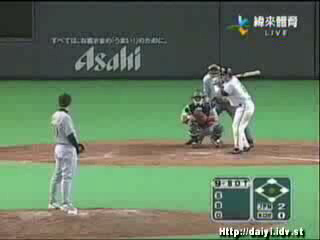

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [113, 113, 113, ..., 139, 156,  80],
       [111, 111, 111, ..., 141, 157,  81],
       [ 73,  73,  73, ...,  77,  94,  22]], dtype=uint8)
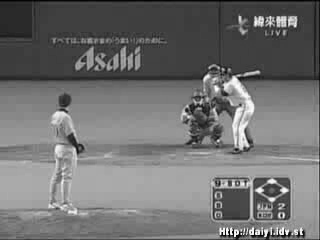

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[131, 105,  91],
        [131, 105,  91],
        [131, 105,  91],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 93,  67,  53],
        [ 93,  67,  53],
        [ 93,  67,  53],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
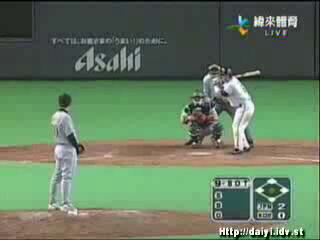

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [113, 113, 113, ..., 139, 156,  80],
       [111, 111, 111, ..., 141, 157,  81],
       [ 73,  73,  73, ...,  77,  94,  22]], dtype=uint8)
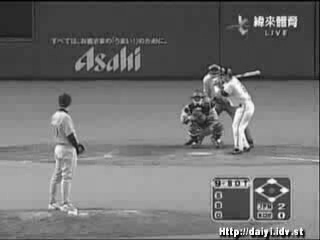

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[128, 102,  88],
        [129, 103,  89],
        [130, 104,  90],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[130, 104,  90],
        [129, 103,  89],
        [128, 102,  88],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 87,  61,  47],
        [ 84,  58,  44],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
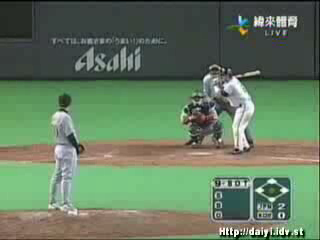

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [108, 109, 110, ..., 139, 156,  80],
       [110, 109, 108, ..., 141, 157,  81],
       [ 70,  67,  64, ...,  77,  94,  22]], dtype=uint8)
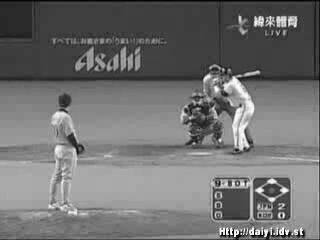

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[128, 102,  88],
        [129, 103,  89],
        [130, 104,  90],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[130, 104,  90],
        [129, 103,  89],
        [128, 102,  88],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 87,  61,  47],
        [ 84,  58,  44],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
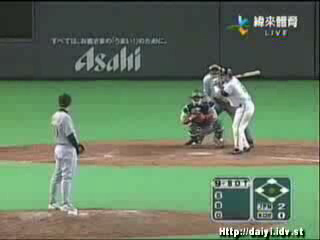

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [108, 109, 110, ..., 139, 156,  80],
       [110, 109, 108, ..., 141, 157,  81],
       [ 70,  67,  64, ...,  77,  94,  22]], dtype=uint8)
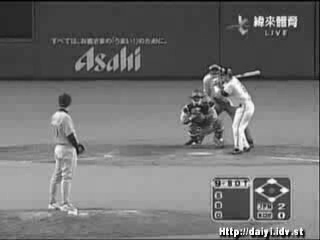

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[128, 102,  88],
        [129, 103,  89],
        [130, 104,  90],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[130, 104,  90],
        [129, 103,  89],
        [128, 102,  88],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 87,  61,  47],
        [ 84,  58,  44],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
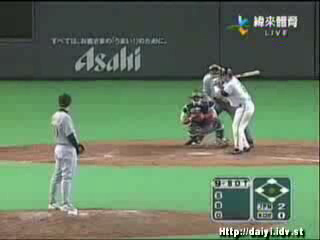

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [108, 109, 110, ..., 139, 156,  80],
       [110, 109, 108, ..., 141, 157,  81],
       [ 70,  67,  64, ...,  77,  94,  22]], dtype=uint8)
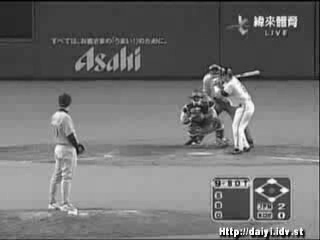

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[134, 108,  94],
        [133, 107,  93],
        [130, 104,  90],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 92,  66,  52],
        [ 92,  66,  52],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
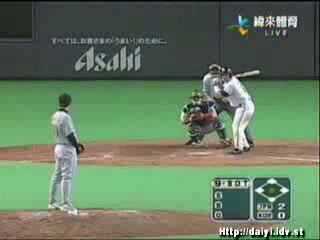

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [114, 113, 110, ..., 139, 156,  80],
       [113, 113, 113, ..., 141, 157,  81],
       [ 70,  72,  72, ...,  77,  94,  22]], dtype=uint8)
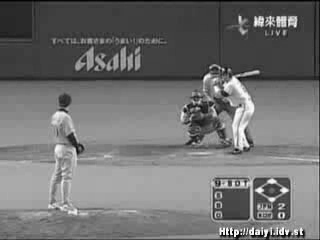

array([[[  0,   4,   0],
        [  0,   4,   0],
        [  0,   4,   0],
        ...,
        [ 13,  17,  19],
        [  9,  13,  15],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 39,  43,  45],
        [ 35,  39,  41],
        [ 13,  17,  19]],

       [[ 39,  44,  38],
        [ 39,  44,  38],
        [ 39,  44,  38],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 29,  33,  35]],

       ...,

       [[134, 108,  94],
        [133, 107,  93],
        [130, 104,  90],
        ...,
        [111, 159, 111],
        [131, 175, 128],
        [ 55,  99,  52]],

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [113, 161, 113],
        [132, 176, 129],
        [ 56, 100,  53]],

       [[ 90,  64,  50],
        [ 92,  66,  52],
        [ 92,  66,  52],
        ...,
        [ 49,  97,  49],
        [ 69, 113,  66],
        [  0,  37,   0]]], dtype=uint8)
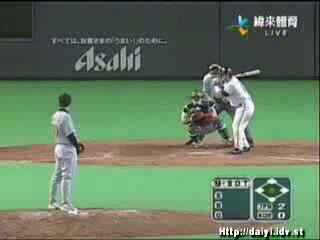

array([[  2,   2,   2, ...,  16,  12,   0],
       [ 24,  24,  24, ...,  42,  38,  16],
       [ 42,  42,  42, ...,  65,  60,  32],
       ...,
       [114, 113, 110, ..., 139, 156,  80],
       [113, 113, 113, ..., 141, 157,  81],
       [ 70,  72,  72, ...,  77,  94,  22]], dtype=uint8)
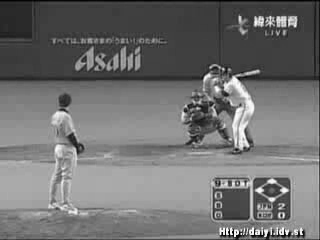

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 57,  98,  52]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [115, 161, 114],
        [136, 177, 131],
        [ 58,  99,  53]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 67, 108,  62],
        [  0,  32,   0]]], dtype=uint8)
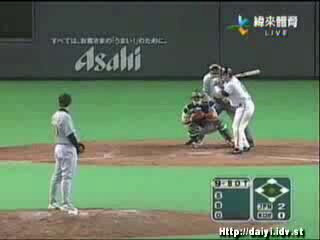

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 141, 158,  80],
       [114, 114, 114, ..., 142, 159,  81],
       [ 67,  70,  70, ...,  74,  90,  19]], dtype=uint8)
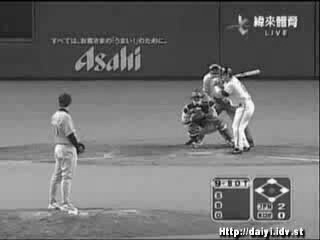

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 57,  98,  52]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [115, 161, 114],
        [136, 177, 131],
        [ 58,  99,  53]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 67, 108,  62],
        [  0,  32,   0]]], dtype=uint8)
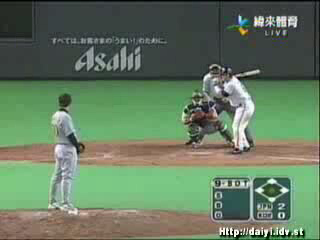

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 141, 158,  80],
       [114, 114, 114, ..., 142, 159,  81],
       [ 67,  70,  70, ...,  74,  90,  19]], dtype=uint8)
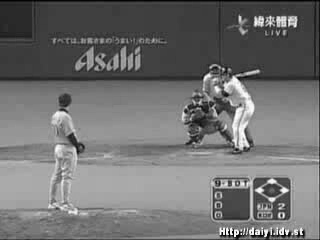

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 57,  98,  52]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [115, 161, 114],
        [136, 177, 131],
        [ 58,  99,  53]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 67, 108,  62],
        [  0,  32,   0]]], dtype=uint8)
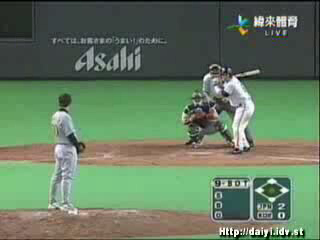

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 141, 158,  80],
       [114, 114, 114, ..., 142, 159,  81],
       [ 67,  70,  70, ...,  74,  90,  19]], dtype=uint8)
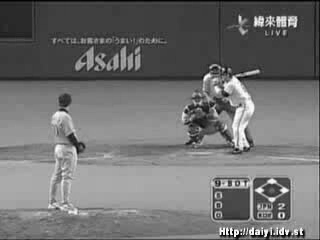

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 57,  98,  52]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [115, 161, 114],
        [136, 177, 131],
        [ 58,  99,  53]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 67, 108,  62],
        [  0,  32,   0]]], dtype=uint8)
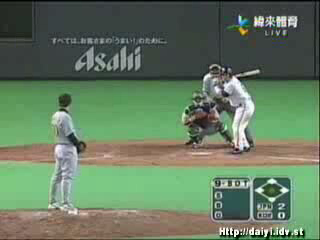

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 141, 158,  80],
       [114, 114, 114, ..., 142, 159,  81],
       [ 67,  70,  70, ...,  74,  90,  19]], dtype=uint8)
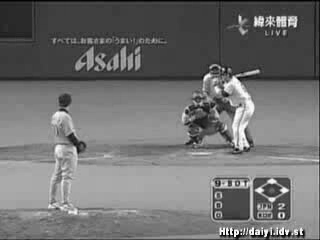

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 57,  98,  52]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [115, 161, 114],
        [136, 177, 131],
        [ 58,  99,  53]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 67, 108,  62],
        [  0,  32,   0]]], dtype=uint8)
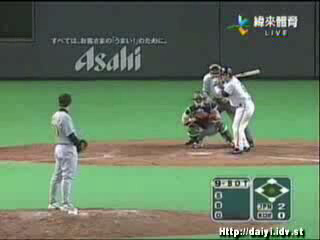

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 141, 158,  80],
       [114, 114, 114, ..., 142, 159,  81],
       [ 67,  70,  70, ...,  74,  90,  19]], dtype=uint8)
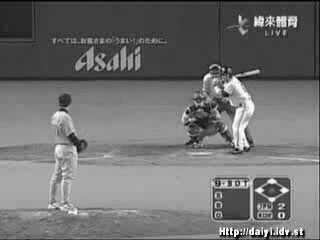

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
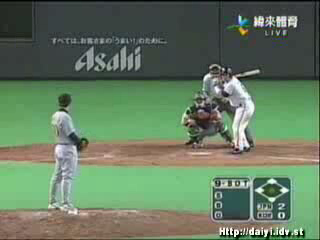

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
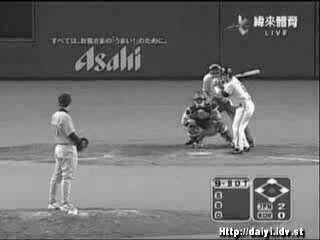

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
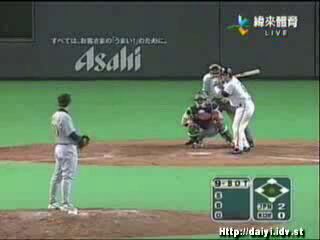

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
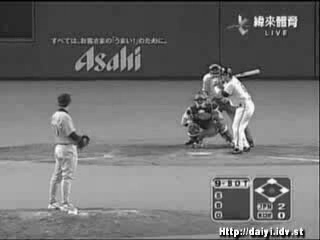

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
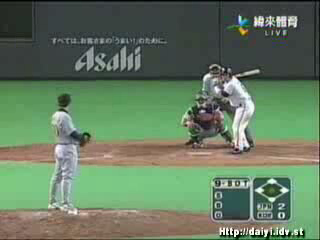

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
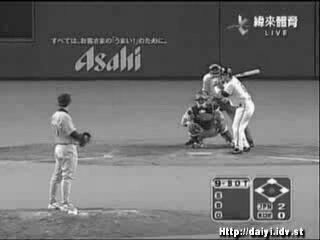

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
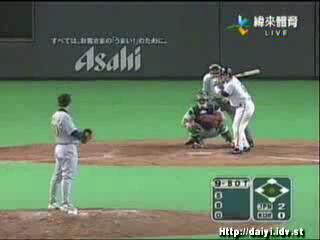

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
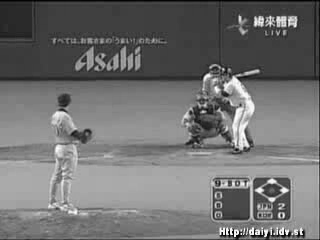

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
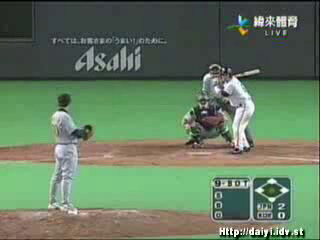

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
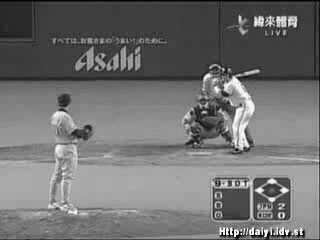

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
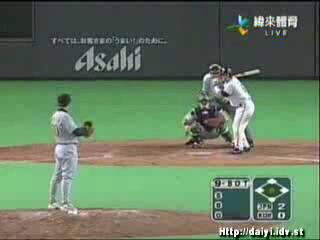

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
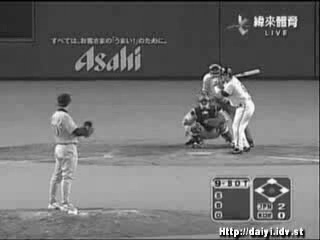

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  7,  11,  13],
        [  0,   0,   0]],

       [[ 20,  25,  19],
        [ 20,  25,  19],
        [ 20,  25,  19],
        ...,
        [ 37,  41,  43],
        [ 33,  37,  39],
        [ 11,  15,  17]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[134, 108,  94],
        [134, 108,  94],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [136, 177, 131],
        [ 56,  97,  51]],

       [[ 87,  61,  47],
        [ 90,  64,  50],
        [ 90,  64,  50],
        ...,
        [ 47,  93,  46],
        [ 66, 107,  61],
        [  0,  28,   0]]], dtype=uint8)
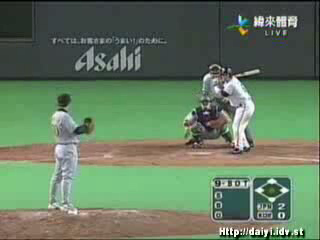

array([[  2,   2,   2, ...,  15,  10,   0],
       [ 23,  23,  23, ...,  40,  36,  14],
       [ 43,  43,  43, ...,  65,  60,  30],
       ...,
       [114, 111, 109, ..., 143, 159,  79],
       [114, 114, 114, ..., 143, 159,  79],
       [ 67,  70,  70, ...,  74,  89,  16]], dtype=uint8)
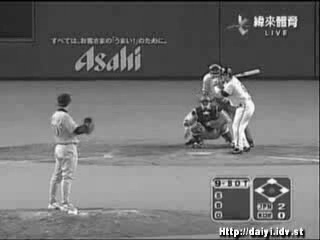

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  8,  12,  14],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 37,  41,  43],
        [ 34,  38,  40],
        [ 12,  16,  18]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 28,  32,  34]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
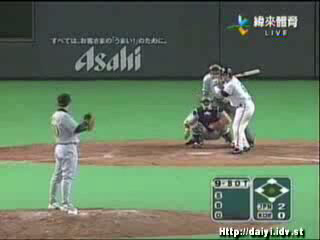

array([[  2,   2,   2, ...,  15,  11,   0],
       [ 24,  24,  24, ...,  40,  37,  15],
       [ 43,  43,  43, ...,  65,  60,  31],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
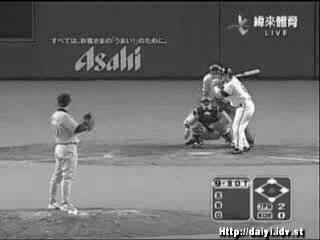

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [ 12,  16,  18],
        [  8,  12,  14],
        [  0,   0,   0]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 37,  41,  43],
        [ 34,  38,  40],
        [ 12,  16,  18]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 62,  66,  68],
        [ 57,  61,  63],
        [ 28,  32,  34]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
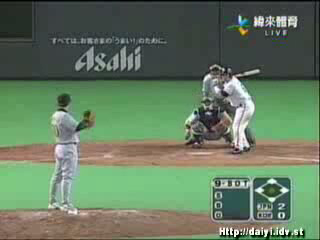

array([[  2,   2,   2, ...,  15,  11,   0],
       [ 24,  24,  24, ...,  40,  37,  15],
       [ 43,  43,  43, ...,  65,  60,  31],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
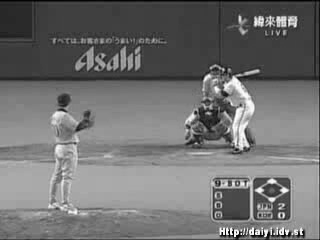

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
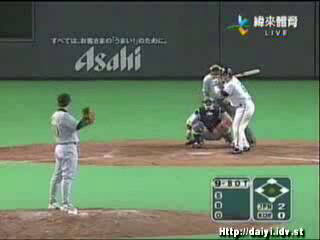

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
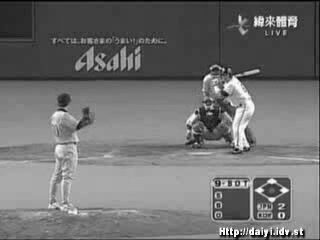

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
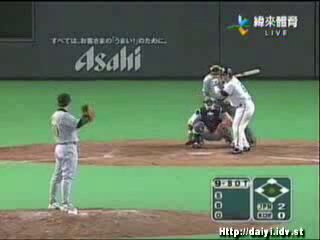

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
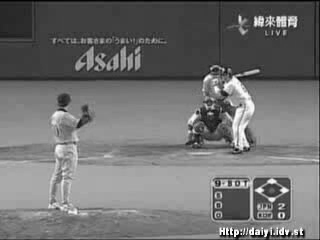

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
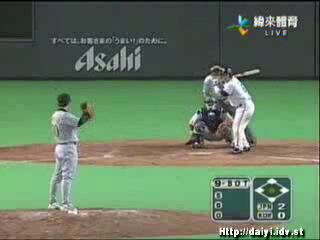

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
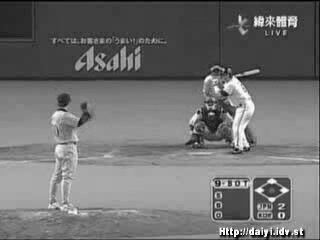

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
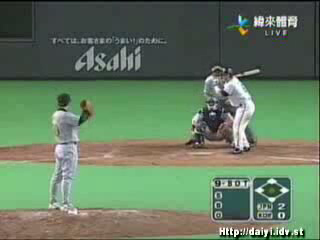

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
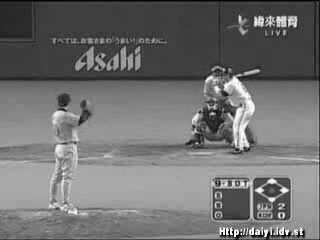

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
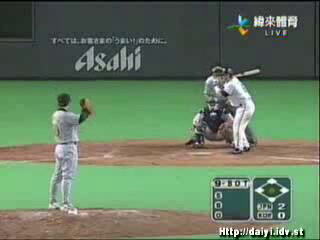

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
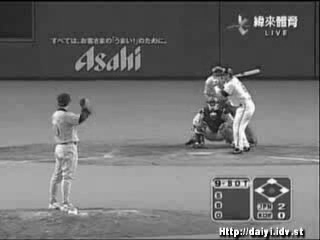

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
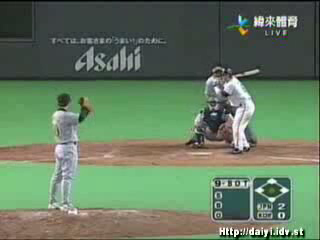

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
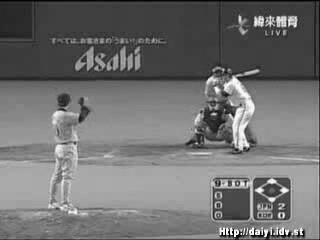

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
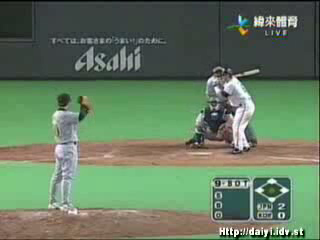

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
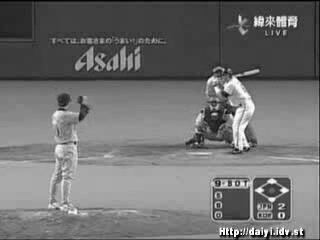

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
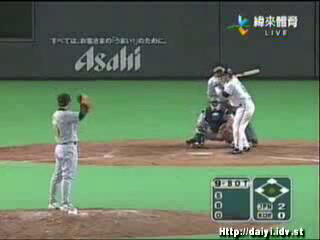

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
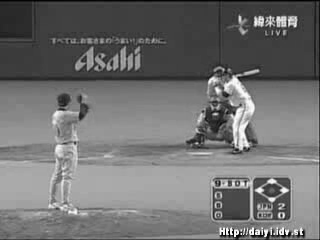

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
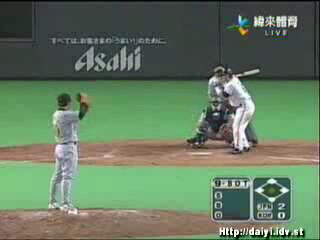

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
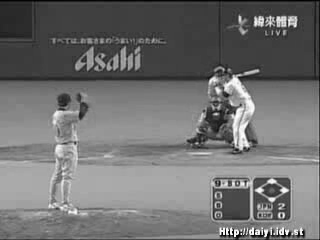

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  4,   8,  10],
        [  6,  10,  12],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 22,  26,  28]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
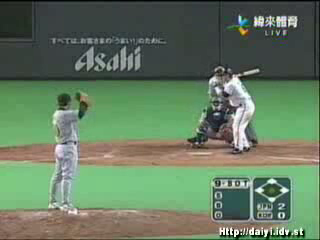

array([[  2,   2,   2, ...,   7,   9,   4],
       [ 24,  24,  24, ...,  43,  42,  25],
       [ 43,  43,  43, ...,  70,  61,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
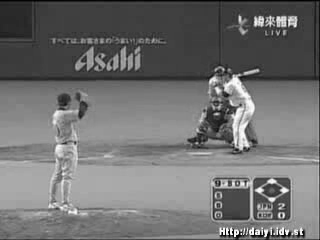

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  5,   9,  11],
        [  2,   6,   8]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 23,  27,  29]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 69,  73,  75],
        [ 61,  65,  67],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
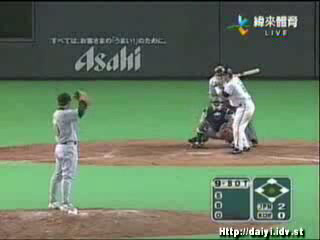

array([[  2,   2,   2, ...,   2,   8,   5],
       [ 24,  24,  24, ...,  43,  42,  26],
       [ 43,  43,  43, ...,  72,  64,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
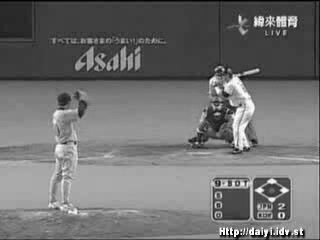

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  5,   9,  11],
        [  2,   6,   8]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 23,  27,  29]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 69,  73,  75],
        [ 61,  65,  67],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
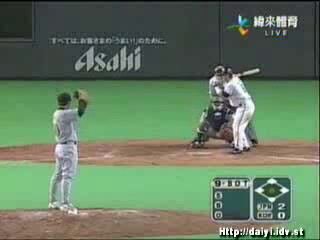

array([[  2,   2,   2, ...,   2,   8,   5],
       [ 24,  24,  24, ...,  43,  42,  26],
       [ 43,  43,  43, ...,  72,  64,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
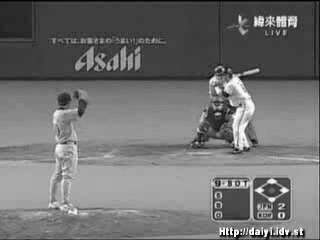

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  5,   9,  11],
        [  2,   6,   8]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 40,  44,  46],
        [ 39,  43,  45],
        [ 23,  27,  29]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 69,  73,  75],
        [ 61,  65,  67],
        [ 27,  31,  33]],

       ...,

       [[133, 107,  93],
        [130, 104,  90],
        [129, 103,  89],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[134, 108,  94],
        [135, 109,  95],
        [134, 108,  94],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  62,  48],
        [ 92,  66,  52],
        [ 91,  65,  51],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
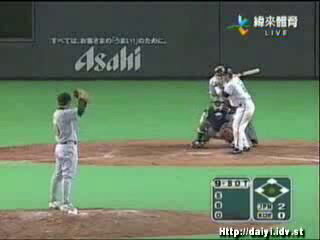

array([[  2,   2,   2, ...,   2,   8,   5],
       [ 24,  24,  24, ...,  43,  42,  26],
       [ 43,  43,  43, ...,  72,  64,  30],
       ...,
       [113, 110, 109, ..., 144, 158,  78],
       [114, 115, 114, ..., 143, 157,  77],
       [ 68,  72,  71, ...,  77,  90,  16]], dtype=uint8)
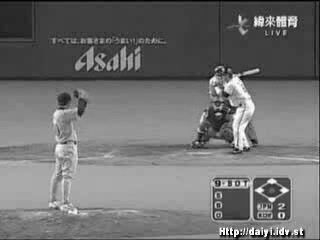

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[131, 105,  91],
        [128, 102,  88],
        [126, 100,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[136, 110,  96],
        [135, 109,  95],
        [133, 107,  93],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 95,  69,  55],
        [ 97,  71,  57],
        [ 92,  66,  52],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
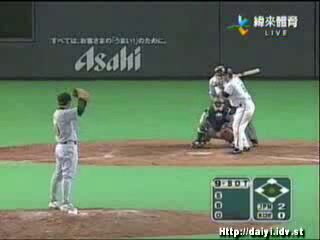

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [111, 108, 106, ..., 144, 158,  78],
       [116, 115, 113, ..., 143, 157,  77],
       [ 75,  77,  72, ...,  77,  90,  16]], dtype=uint8)
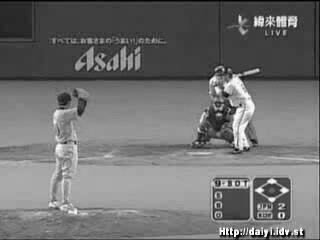

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[131, 105,  91],
        [128, 102,  88],
        [126, 100,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[136, 110,  96],
        [135, 109,  95],
        [133, 107,  93],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 95,  69,  55],
        [ 97,  71,  57],
        [ 92,  66,  52],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
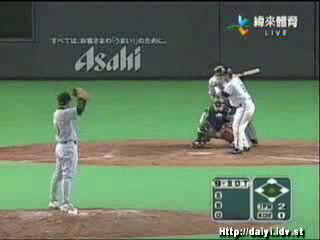

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [111, 108, 106, ..., 144, 158,  78],
       [116, 115, 113, ..., 143, 157,  77],
       [ 75,  77,  72, ...,  77,  90,  16]], dtype=uint8)
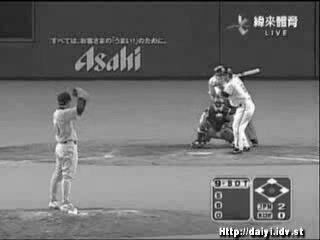

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[131, 105,  91],
        [128, 102,  88],
        [126, 100,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[136, 110,  96],
        [135, 109,  95],
        [133, 107,  93],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 95,  69,  55],
        [ 97,  71,  57],
        [ 92,  66,  52],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
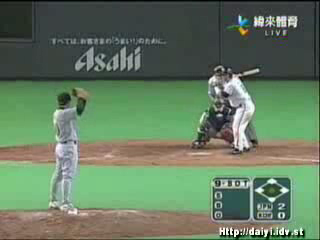

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [111, 108, 106, ..., 144, 158,  78],
       [116, 115, 113, ..., 143, 157,  77],
       [ 75,  77,  72, ...,  77,  90,  16]], dtype=uint8)
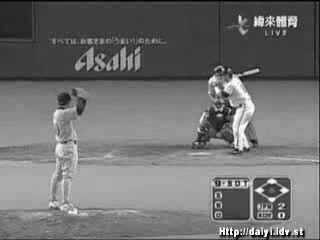

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[128, 102,  88],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 103,  89],
        [129, 103,  89],
        [127, 101,  87],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  61,  47],
        [ 88,  62,  48],
        [ 85,  59,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
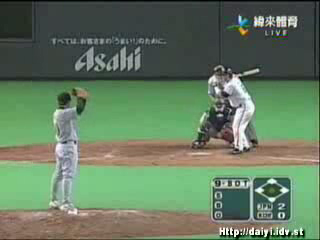

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [108, 104, 103, ..., 144, 158,  78],
       [109, 109, 107, ..., 143, 157,  77],
       [ 67,  68,  65, ...,  77,  90,  16]], dtype=uint8)
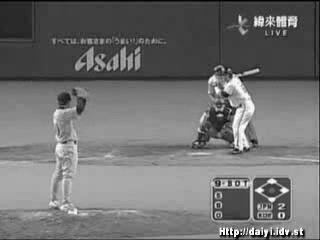

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[128, 102,  88],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 103,  89],
        [129, 103,  89],
        [127, 101,  87],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  61,  47],
        [ 88,  62,  48],
        [ 85,  59,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
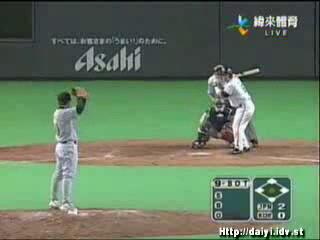

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [108, 104, 103, ..., 144, 158,  78],
       [109, 109, 107, ..., 143, 157,  77],
       [ 67,  68,  65, ...,  77,  90,  16]], dtype=uint8)
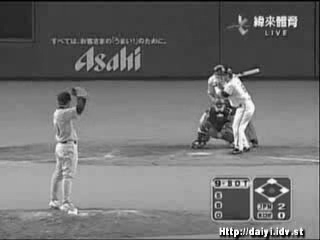

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[128, 102,  88],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 103,  89],
        [129, 103,  89],
        [127, 101,  87],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  61,  47],
        [ 88,  62,  48],
        [ 85,  59,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
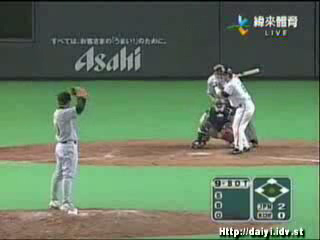

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [108, 104, 103, ..., 144, 158,  78],
       [109, 109, 107, ..., 143, 157,  77],
       [ 67,  68,  65, ...,  77,  90,  16]], dtype=uint8)
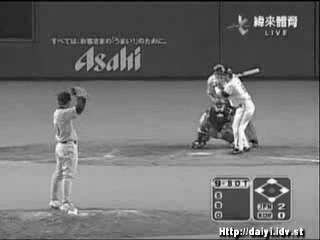

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  2,   6,   8],
        [  0,   4,   6]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 34,  38,  40],
        [ 19,  23,  25]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 60,  64,  66],
        [ 26,  30,  32]],

       ...,

       [[128, 102,  88],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 103,  89],
        [129, 103,  89],
        [127, 101,  87],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  61,  47],
        [ 88,  62,  48],
        [ 85,  59,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
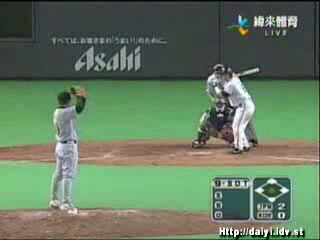

array([[  2,   2,   2, ...,   1,   5,   3],
       [ 24,  24,  24, ...,  38,  37,  22],
       [ 43,  43,  43, ...,  71,  63,  29],
       ...,
       [108, 104, 103, ..., 144, 158,  78],
       [109, 109, 107, ..., 143, 157,  77],
       [ 67,  68,  65, ...,  77,  90,  16]], dtype=uint8)
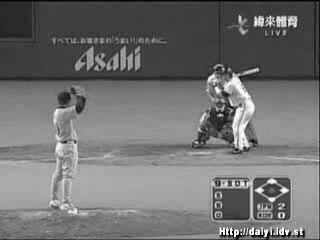

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  0,   4,   6],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 32,  36,  38],
        [ 20,  24,  26]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[127, 104,  89],
        [124, 101,  86],
        [124, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 108,  93],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 87,  66,  51],
        [ 81,  60,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
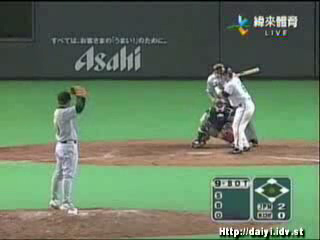

array([[  2,   2,   2, ...,   1,   3,   4],
       [ 24,  24,  24, ...,  38,  35,  23],
       [ 43,  43,  43, ...,  71,  60,  30],
       ...,
       [109, 106, 106, ..., 144, 158,  78],
       [113, 111, 108, ..., 143, 157,  77],
       [ 72,  71,  65, ...,  77,  90,  16]], dtype=uint8)
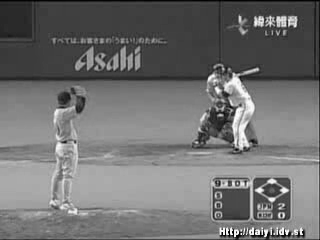

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  0,   4,   6],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 35,  39,  41],
        [ 32,  36,  38],
        [ 20,  24,  26]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 57,  61,  63],
        [ 27,  31,  33]],

       ...,

       [[127, 104,  89],
        [124, 101,  86],
        [124, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[129, 108,  93],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 87,  66,  51],
        [ 81,  60,  45],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
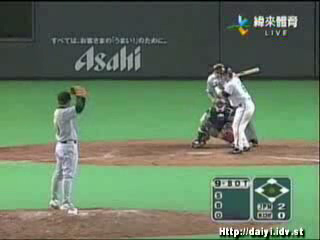

array([[  2,   2,   2, ...,   1,   3,   4],
       [ 24,  24,  24, ...,  38,  35,  23],
       [ 43,  43,  43, ...,  71,  60,  30],
       ...,
       [109, 106, 106, ..., 144, 158,  78],
       [113, 111, 108, ..., 143, 157,  77],
       [ 72,  71,  65, ...,  77,  90,  16]], dtype=uint8)
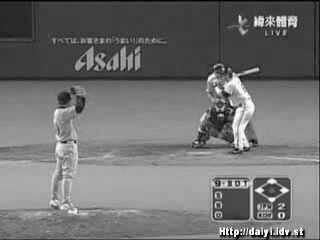

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[123, 102,  87],
        [122, 101,  86],
        [120,  99,  84],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[127, 106,  91],
        [125, 104,  89],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
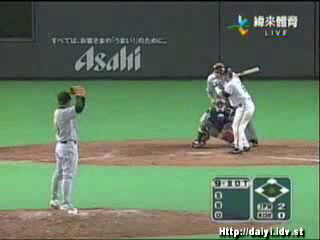

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [107, 106, 104, ..., 144, 158,  78],
       [111, 109, 106, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
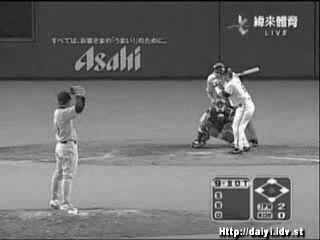

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[123, 102,  87],
        [122, 101,  86],
        [120,  99,  84],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[127, 106,  91],
        [125, 104,  89],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
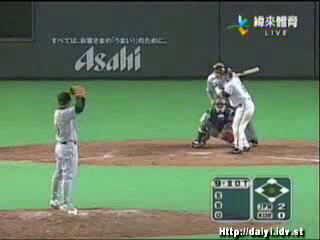

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [107, 106, 104, ..., 144, 158,  78],
       [111, 109, 106, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
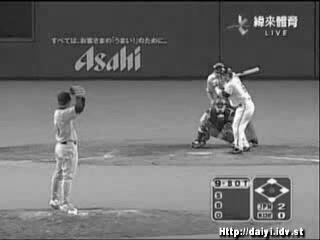

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[123, 102,  87],
        [122, 101,  86],
        [120,  99,  84],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[127, 106,  91],
        [125, 104,  89],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
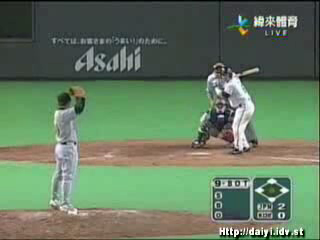

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [107, 106, 104, ..., 144, 158,  78],
       [111, 109, 106, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
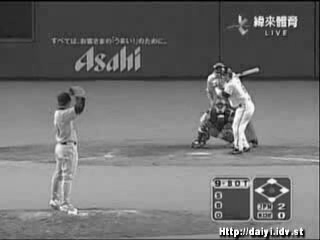

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[123, 102,  87],
        [122, 101,  86],
        [120,  99,  84],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[127, 106,  91],
        [125, 104,  89],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
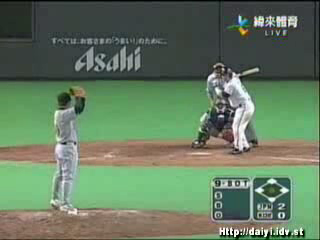

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [107, 106, 104, ..., 144, 158,  78],
       [111, 109, 106, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
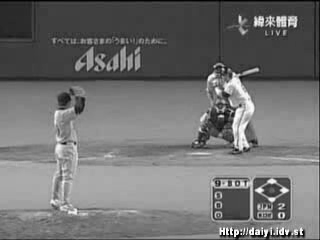

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[123, 102,  87],
        [122, 101,  86],
        [120,  99,  84],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[127, 106,  91],
        [125, 104,  89],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
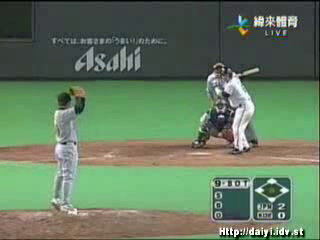

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [107, 106, 104, ..., 144, 158,  78],
       [111, 109, 106, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
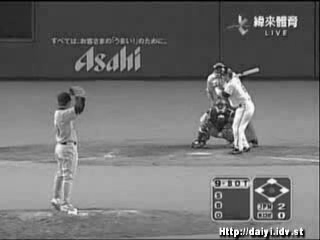

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[129, 108,  93],
        [126, 105,  90],
        [124, 103,  88],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[131, 110,  95],
        [129, 108,  93],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 88,  67,  52],
        [ 84,  63,  48],
        [ 79,  58,  43],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
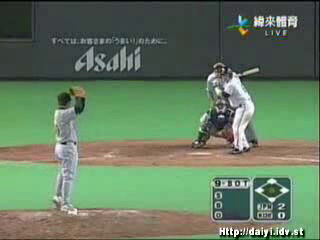

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [113, 110, 108, ..., 144, 158,  78],
       [115, 113, 108, ..., 143, 157,  77],
       [ 72,  68,  63, ...,  77,  90,  16]], dtype=uint8)
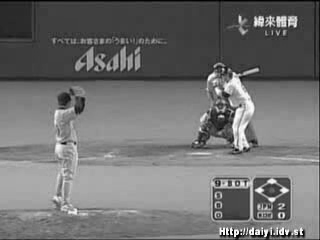

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   3,   5],
        [  4,   8,  10],
        [  1,   5,   7]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 34,  38,  40],
        [ 32,  36,  38],
        [ 16,  20,  22]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 67,  71,  73],
        [ 57,  61,  63],
        [ 26,  30,  32]],

       ...,

       [[127, 106,  91],
        [125, 104,  89],
        [123, 102,  87],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[130, 109,  94],
        [126, 105,  90],
        [122, 101,  86],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 86,  65,  50],
        [ 81,  60,  45],
        [ 75,  54,  39],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
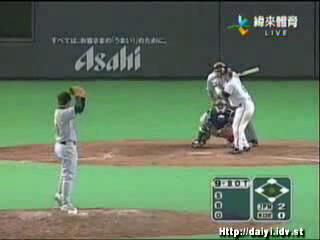

array([[  2,   2,   2, ...,   2,   7,   4],
       [ 24,  24,  24, ...,  37,  35,  19],
       [ 43,  43,  43, ...,  70,  60,  29],
       ...,
       [111, 109, 107, ..., 144, 158,  78],
       [114, 110, 106, ..., 143, 157,  77],
       [ 70,  65,  59, ...,  77,  90,  16]], dtype=uint8)
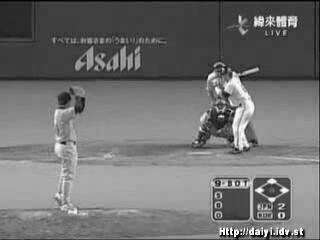

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  1,   5,   7],
        [  0,   3,   5]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 33,  37,  39],
        [ 30,  34,  36],
        [ 15,  19,  21]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[120,  99,  84],
        [122, 101,  86],
        [122, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[126, 105,  90],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  66,  51],
        [ 86,  65,  50],
        [ 82,  61,  46],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
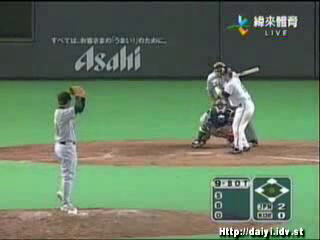

array([[  2,   2,   2, ...,   1,   4,   2],
       [ 24,  24,  24, ...,  36,  33,  18],
       [ 43,  43,  43, ...,  71,  61,  30],
       ...,
       [104, 106, 106, ..., 144, 158,  78],
       [110, 111, 108, ..., 143, 157,  77],
       [ 71,  70,  66, ...,  77,  90,  16]], dtype=uint8)
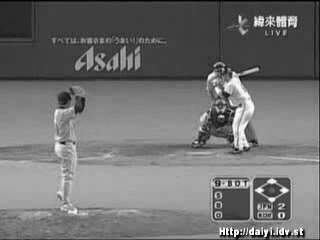

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  1,   5,   7],
        [  0,   3,   5]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 33,  37,  39],
        [ 30,  34,  36],
        [ 15,  19,  21]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[120,  99,  84],
        [122, 101,  86],
        [122, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[126, 105,  90],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  66,  51],
        [ 86,  65,  50],
        [ 82,  61,  46],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
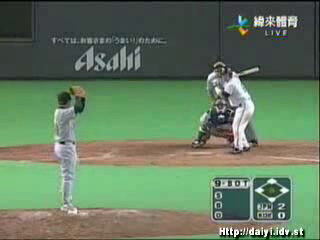

array([[  2,   2,   2, ...,   1,   4,   2],
       [ 24,  24,  24, ...,  36,  33,  18],
       [ 43,  43,  43, ...,  71,  61,  30],
       ...,
       [104, 106, 106, ..., 144, 158,  78],
       [110, 111, 108, ..., 143, 157,  77],
       [ 71,  70,  66, ...,  77,  90,  16]], dtype=uint8)
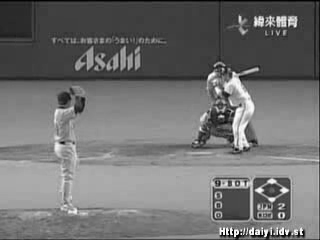

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  1,   5,   7],
        [  0,   3,   5]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 33,  37,  39],
        [ 30,  34,  36],
        [ 15,  19,  21]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[120,  99,  84],
        [122, 101,  86],
        [122, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[126, 105,  90],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  66,  51],
        [ 86,  65,  50],
        [ 82,  61,  46],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
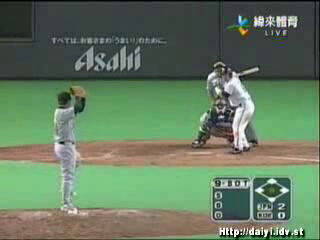

array([[  2,   2,   2, ...,   1,   4,   2],
       [ 24,  24,  24, ...,  36,  33,  18],
       [ 43,  43,  43, ...,  71,  61,  30],
       ...,
       [104, 106, 106, ..., 144, 158,  78],
       [110, 111, 108, ..., 143, 157,  77],
       [ 71,  70,  66, ...,  77,  90,  16]], dtype=uint8)
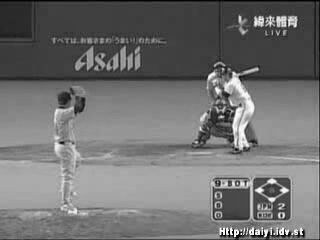

array([[[  0,   3,   0],
        [  0,   3,   0],
        [  0,   3,   0],
        ...,
        [  0,   1,   3],
        [  1,   5,   7],
        [  0,   3,   5]],

       [[ 21,  26,  20],
        [ 21,  26,  20],
        [ 21,  26,  20],
        ...,
        [ 33,  37,  39],
        [ 30,  34,  36],
        [ 15,  19,  21]],

       [[ 40,  45,  39],
        [ 40,  45,  39],
        [ 40,  45,  39],
        ...,
        [ 68,  72,  74],
        [ 58,  62,  64],
        [ 27,  31,  33]],

       ...,

       [[120,  99,  84],
        [122, 101,  86],
        [122, 101,  86],
        ...,
        [117, 163, 116],
        [135, 176, 130],
        [ 55,  96,  50]],

       [[126, 105,  90],
        [127, 106,  91],
        [124, 103,  88],
        ...,
        [116, 162, 115],
        [134, 175, 129],
        [ 54,  95,  49]],

       [[ 87,  66,  51],
        [ 86,  65,  50],
        [ 82,  61,  46],
        ...,
        [ 50,  96,  49],
        [ 67, 108,  62],
        [  0,  28,   0]]], dtype=uint8)
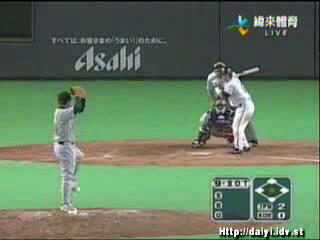

array([[  2,   2,   2, ...,   1,   4,   2],
       [ 24,  24,  24, ...,  36,  33,  18],
       [ 43,  43,  43, ...,  71,  61,  30],
       ...,
       [104, 106, 106, ..., 144, 158,  78],
       [110, 111, 108, ..., 143, 157,  77],
       [ 71,  70,  66, ...,  77,  90,  16]], dtype=uint8)
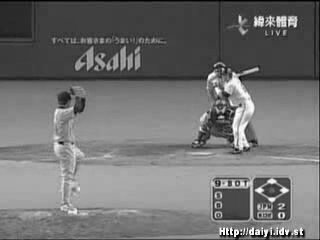

array([[[  0,   5,   0],
        [  0,   5,   0],
        [  0,   5,   0],
        ...,
        [  0,   5,   6],
        [  4,  10,  11],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 31,  37,  38],
        [ 31,  37,  38],
        [ 12,  18,  19]],

       [[ 40,  47,  40],
        [ 40,  47,  40],
        [ 40,  47,  40],
        ...,
        [ 60,  66,  67],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[119,  96,  81],
        [120,  97,  82],
        [120,  97,  82],
        ...,
        [114, 160, 113],
        [135, 176, 130],
        [ 59, 100,  54]],

       [[134, 108,  94],
        [134, 108,  94],
        [129, 103,  89],
        ...,
        [112, 158, 111],
        [135, 176, 130],
        [ 61, 102,  56]],

       [[ 94,  68,  54],
        [ 92,  66,  52],
        [ 86,  60,  46],
        ...,
        [ 47,  93,  46],
        [ 71, 112,  66],
        [  0,  39,   0]]], dtype=uint8)
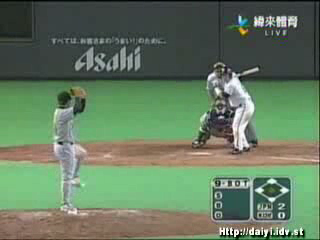

array([[  3,   3,   3, ...,   4,   8,   0],
       [ 25,  25,  25, ...,  35,  35,  16],
       [ 44,  44,  44, ...,  64,  60,  32],
       ...,
       [101, 102, 102, ..., 141, 158,  82],
       [114, 114, 109, ..., 139, 158,  84],
       [ 74,  72,  66, ...,  74,  94,  23]], dtype=uint8)
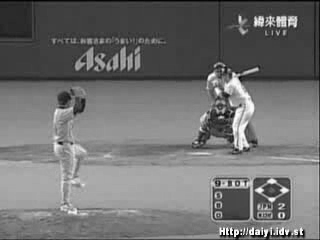

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
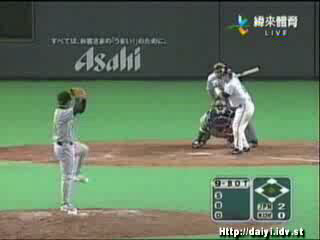

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
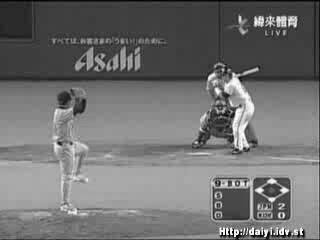

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
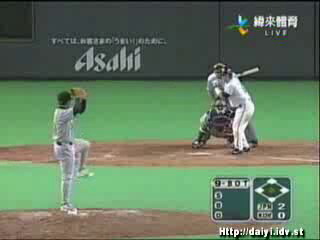

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
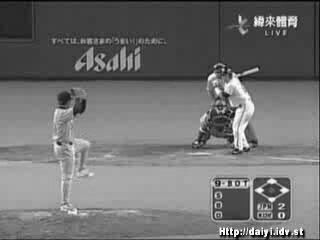

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
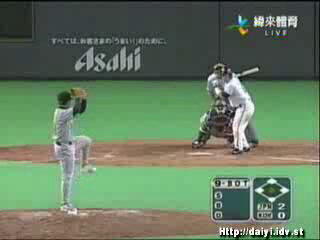

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
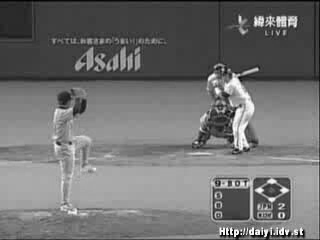

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
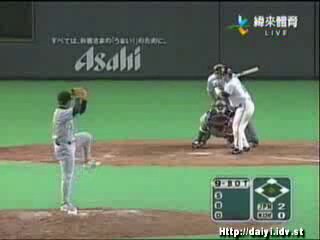

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
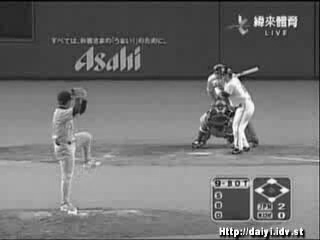

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
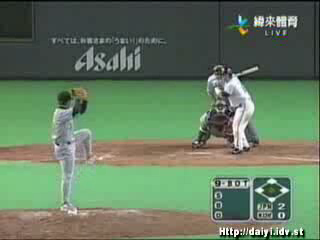

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
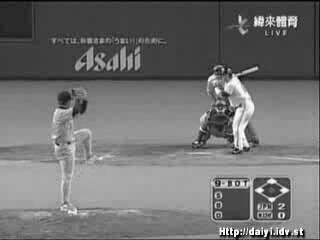

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
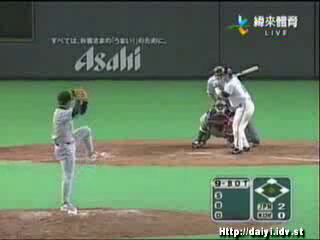

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
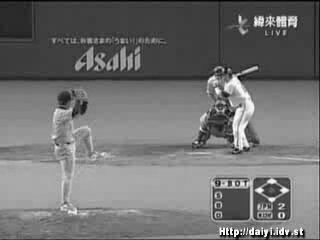

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
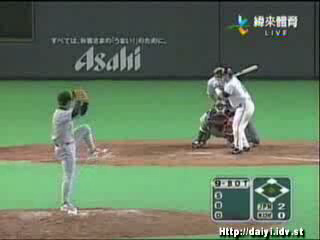

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
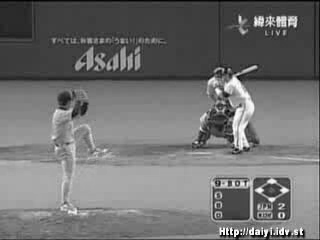

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
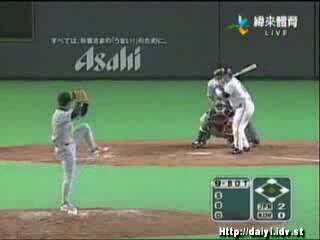

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
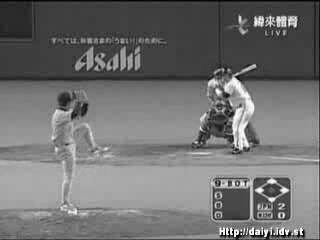

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  1,   7,   8],
        [  7,  13,  14],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 29,  35,  36],
        [ 32,  38,  39],
        [ 11,  17,  18]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 59,  65,  66],
        [ 56,  62,  63],
        [ 28,  34,  35]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
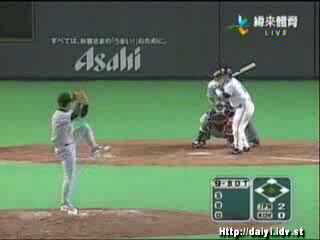

array([[  4,   4,   4, ...,   5,  11,   0],
       [ 25,  25,  25, ...,  33,  36,  15],
       [ 43,  43,  43, ...,  63,  60,  32],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
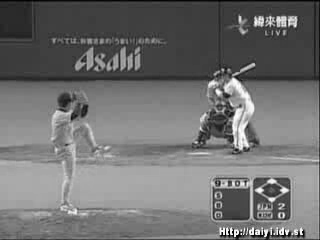

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   4,   5],
        [  4,  10,  11],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 29,  35,  36],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 55,  61,  62],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
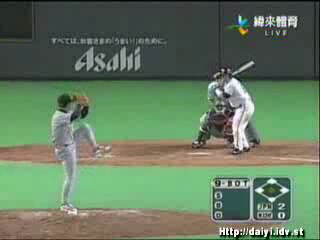

array([[  4,   4,   4, ...,   3,   8,   0],
       [ 25,  25,  25, ...,  31,  33,  12],
       [ 43,  43,  43, ...,  61,  59,  31],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
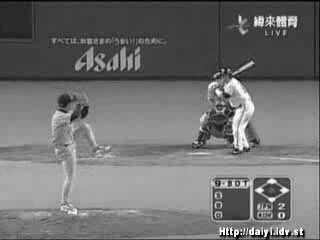

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   4,   5],
        [  4,  10,  11],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 29,  35,  36],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 55,  61,  62],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
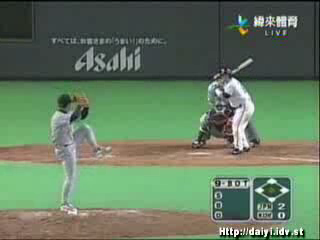

array([[  4,   4,   4, ...,   3,   8,   0],
       [ 25,  25,  25, ...,  31,  33,  12],
       [ 43,  43,  43, ...,  61,  59,  31],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
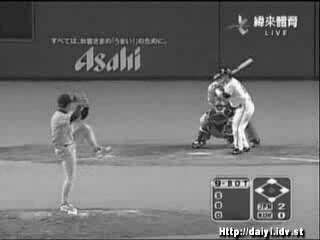

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   4,   5],
        [  4,  10,  11],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 29,  35,  36],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 55,  61,  62],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
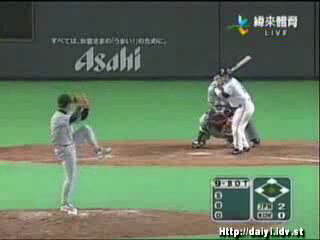

array([[  4,   4,   4, ...,   3,   8,   0],
       [ 25,  25,  25, ...,  31,  33,  12],
       [ 43,  43,  43, ...,  61,  59,  31],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
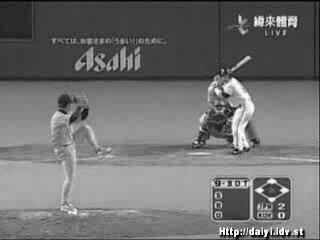

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [121,  95,  81],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [135, 109,  95],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 93,  67,  53],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
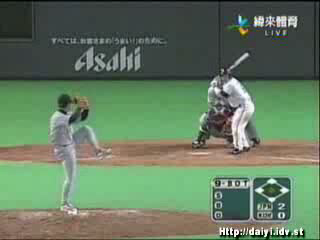

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 101, 102, ..., 138, 157,  84],
       [118, 115, 110, ..., 137, 159,  87],
       [ 79,  73,  64, ...,  72,  95,  26]], dtype=uint8)
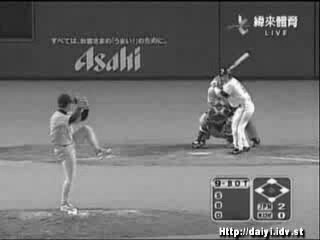

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [122,  96,  82],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [137, 111,  97],
        [133, 107,  93],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 97,  71,  57],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
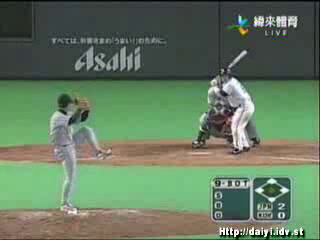

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 102, 102, ..., 138, 157,  84],
       [118, 117, 113, ..., 137, 159,  87],
       [ 79,  77,  68, ...,  72,  95,  26]], dtype=uint8)
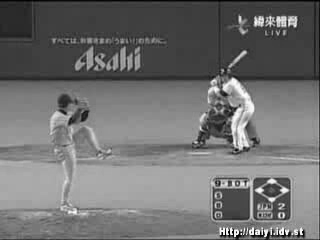

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [122,  96,  82],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [137, 111,  97],
        [133, 107,  93],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 97,  71,  57],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
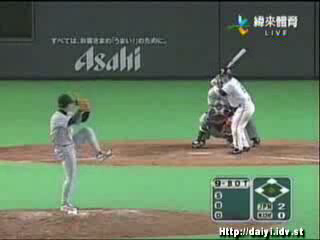

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 102, 102, ..., 138, 157,  84],
       [118, 117, 113, ..., 137, 159,  87],
       [ 79,  77,  68, ...,  72,  95,  26]], dtype=uint8)
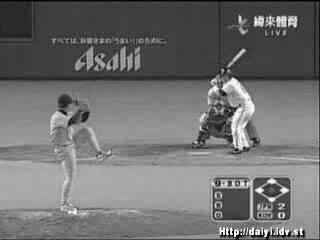

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [122,  96,  82],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [137, 111,  97],
        [133, 107,  93],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 97,  71,  57],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
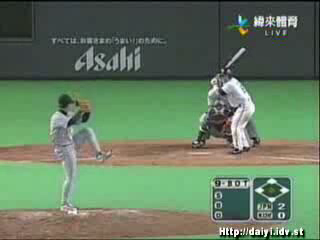

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 102, 102, ..., 138, 157,  84],
       [118, 117, 113, ..., 137, 159,  87],
       [ 79,  77,  68, ...,  72,  95,  26]], dtype=uint8)
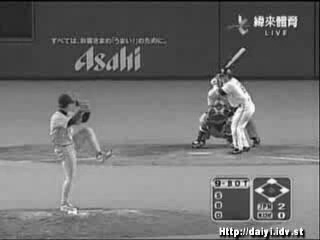

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [122,  96,  82],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [137, 111,  97],
        [133, 107,  93],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 97,  71,  57],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
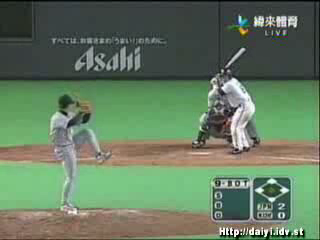

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 102, 102, ..., 138, 157,  84],
       [118, 117, 113, ..., 137, 159,  87],
       [ 79,  77,  68, ...,  72,  95,  26]], dtype=uint8)
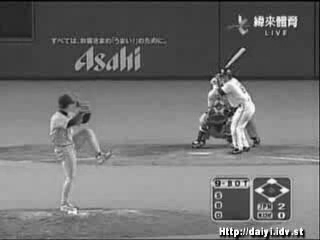

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[122,  96,  82],
        [122,  96,  82],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [137, 111,  97],
        [133, 107,  93],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 99,  73,  59],
        [ 97,  71,  57],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
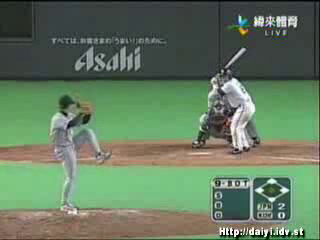

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [102, 102, 102, ..., 138, 157,  84],
       [118, 117, 113, ..., 137, 159,  87],
       [ 79,  77,  68, ...,  72,  95,  26]], dtype=uint8)
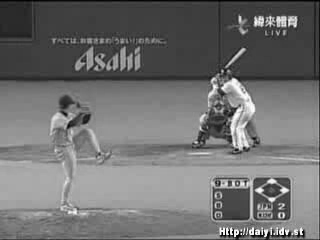

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[124,  98,  84],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 83,  57,  43],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
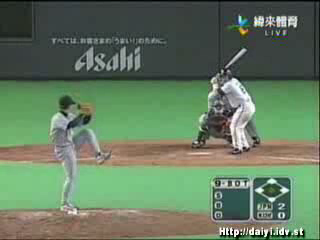

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [104, 104, 103, ..., 138, 157,  84],
       [115, 114, 109, ..., 137, 159,  87],
       [ 72,  70,  63, ...,  72,  95,  26]], dtype=uint8)
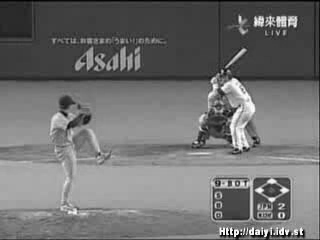

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[124,  98,  84],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 83,  57,  43],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
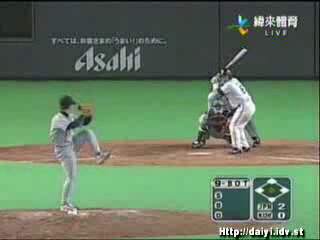

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [104, 104, 103, ..., 138, 157,  84],
       [115, 114, 109, ..., 137, 159,  87],
       [ 72,  70,  63, ...,  72,  95,  26]], dtype=uint8)
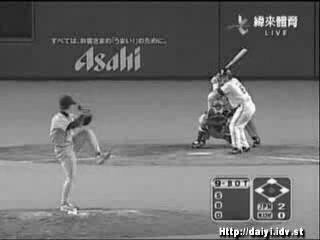

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[124,  98,  84],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 83,  57,  43],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
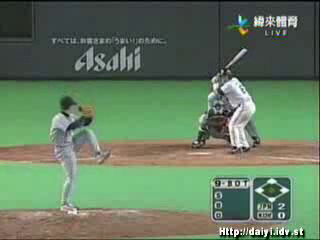

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [104, 104, 103, ..., 138, 157,  84],
       [115, 114, 109, ..., 137, 159,  87],
       [ 72,  70,  63, ...,  72,  95,  26]], dtype=uint8)
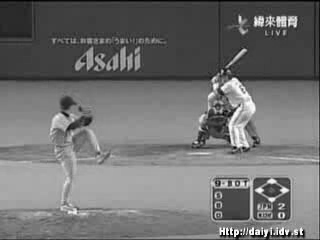

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[124,  98,  84],
        [124,  98,  84],
        [123,  97,  83],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 83,  57,  43],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
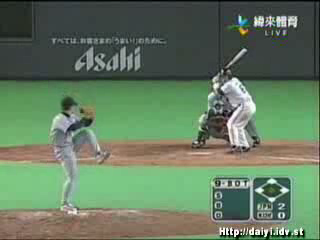

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [104, 104, 103, ..., 138, 157,  84],
       [115, 114, 109, ..., 137, 159,  87],
       [ 72,  70,  63, ...,  72,  95,  26]], dtype=uint8)
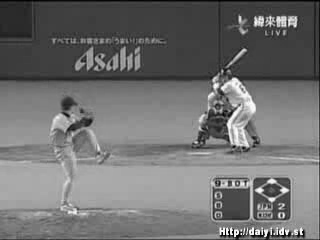

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[137, 111,  97],
        [136, 110,  96],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 92,  66,  52],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
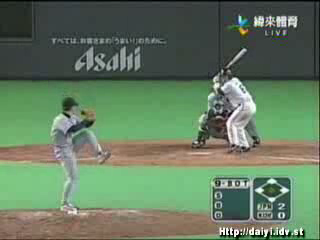

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 104, ..., 138, 157,  84],
       [117, 116, 111, ..., 137, 159,  87],
       [ 74,  72,  65, ...,  72,  95,  26]], dtype=uint8)
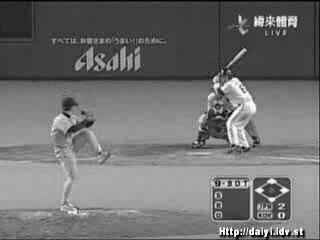

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[137, 111,  97],
        [136, 110,  96],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 92,  66,  52],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
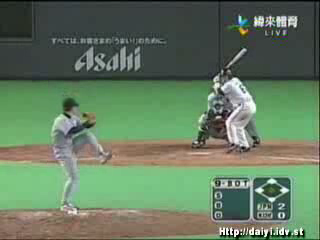

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 104, ..., 138, 157,  84],
       [117, 116, 111, ..., 137, 159,  87],
       [ 74,  72,  65, ...,  72,  95,  26]], dtype=uint8)
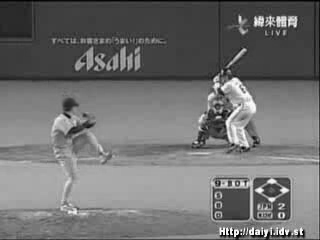

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[124,  98,  84],
        [124,  98,  84],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[137, 111,  97],
        [135, 109,  95],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 95,  69,  55],
        [ 92,  66,  52],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
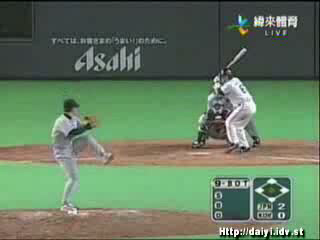

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [104, 104, 104, ..., 138, 157,  84],
       [117, 115, 111, ..., 137, 159,  87],
       [ 75,  72,  65, ...,  72,  95,  26]], dtype=uint8)
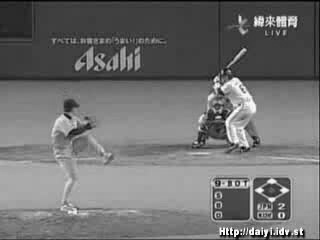

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 97,  71,  57],
        [ 93,  67,  53],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
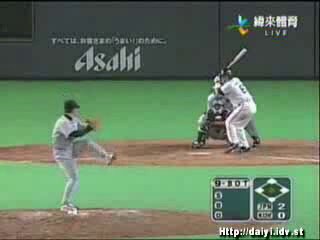

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 104, ..., 138, 157,  84],
       [118, 116, 111, ..., 137, 159,  87],
       [ 77,  73,  65, ...,  72,  95,  26]], dtype=uint8)
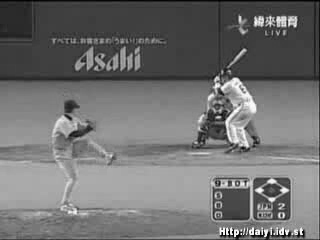

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 97,  71,  57],
        [ 93,  67,  53],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
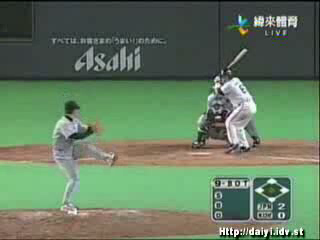

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 104, ..., 138, 157,  84],
       [118, 116, 111, ..., 137, 159,  87],
       [ 77,  73,  65, ...,  72,  95,  26]], dtype=uint8)
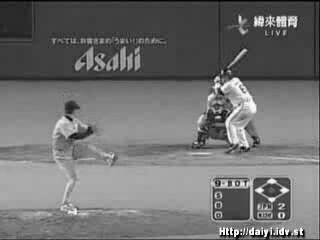

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [124,  98,  84],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [131, 105,  91],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 97,  71,  57],
        [ 93,  67,  53],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
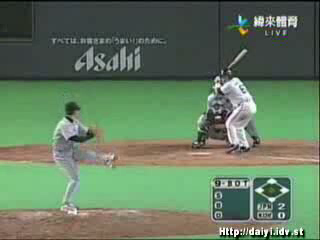

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 104, ..., 138, 157,  84],
       [118, 116, 111, ..., 137, 159,  87],
       [ 77,  73,  65, ...,  72,  95,  26]], dtype=uint8)
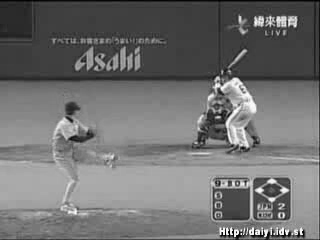

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
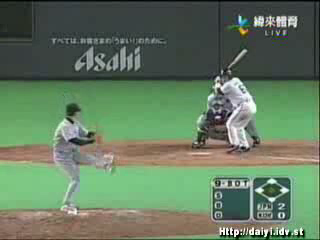

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 114, 110, ..., 137, 159,  87],
       [ 72,  70,  64, ...,  72,  95,  26]], dtype=uint8)
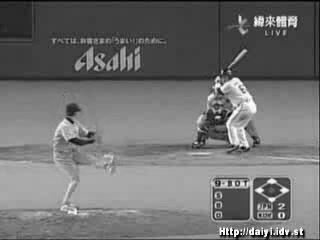

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
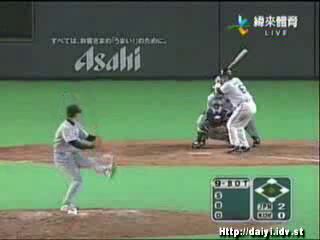

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 114, 110, ..., 137, 159,  87],
       [ 72,  70,  64, ...,  72,  95,  26]], dtype=uint8)
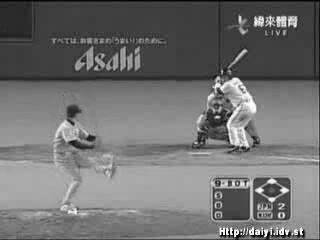

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [134, 108,  94],
        [130, 104,  90],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 92,  66,  52],
        [ 90,  64,  50],
        [ 84,  58,  44],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
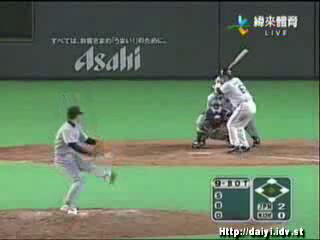

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 114, 110, ..., 137, 159,  87],
       [ 72,  70,  64, ...,  72,  95,  26]], dtype=uint8)
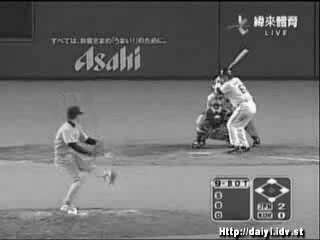

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [133, 107,  93],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 91,  65,  51],
        [ 87,  61,  47],
        [ 81,  55,  41],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
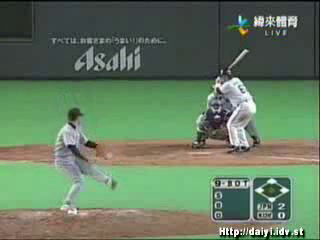

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 113, 109, ..., 137, 159,  87],
       [ 71,  67,  61, ...,  72,  95,  26]], dtype=uint8)
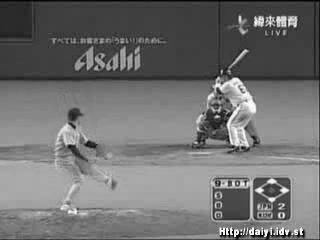

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [133, 107,  93],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 91,  65,  51],
        [ 87,  61,  47],
        [ 81,  55,  41],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
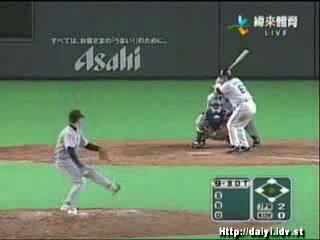

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 113, 109, ..., 137, 159,  87],
       [ 71,  67,  61, ...,  72,  95,  26]], dtype=uint8)
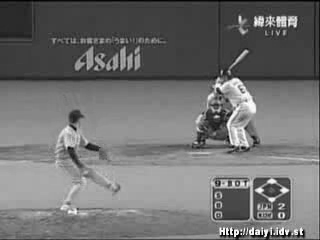

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [133, 107,  93],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 91,  65,  51],
        [ 87,  61,  47],
        [ 81,  55,  41],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
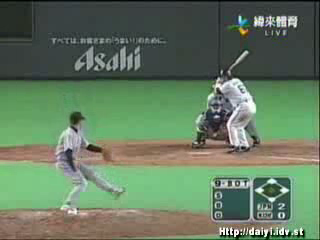

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 113, 109, ..., 137, 159,  87],
       [ 71,  67,  61, ...,  72,  95,  26]], dtype=uint8)
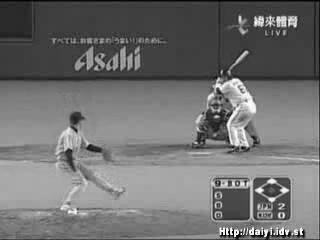

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [133, 107,  93],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 91,  65,  51],
        [ 87,  61,  47],
        [ 81,  55,  41],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
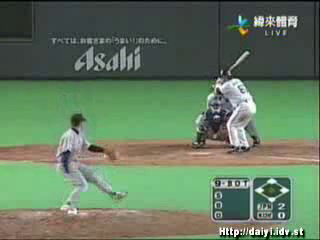

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 113, 109, ..., 137, 159,  87],
       [ 71,  67,  61, ...,  72,  95,  26]], dtype=uint8)
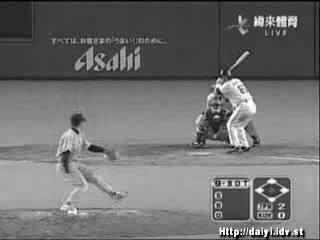

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[123,  97,  83],
        [123,  97,  83],
        [122,  96,  82],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[135, 109,  95],
        [133, 107,  93],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 91,  65,  51],
        [ 87,  61,  47],
        [ 81,  55,  41],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
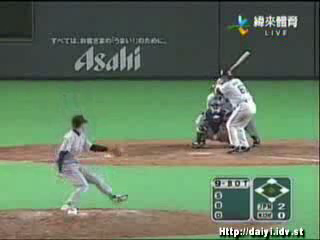

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [103, 103, 102, ..., 138, 157,  84],
       [115, 113, 109, ..., 137, 159,  87],
       [ 71,  67,  61, ...,  72,  95,  26]], dtype=uint8)
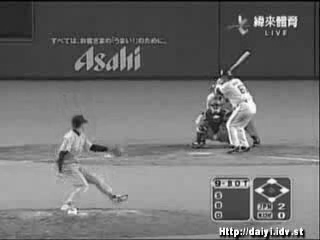

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [126, 100,  86],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 88,  62,  48],
        [ 84,  58,  44],
        [ 79,  53,  39],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
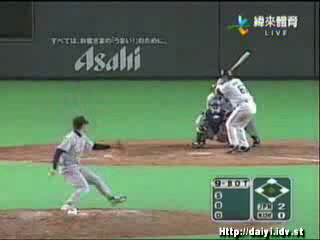

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 106, ..., 138, 157,  84],
       [114, 111, 109, ..., 137, 159,  87],
       [ 68,  64,  59, ...,  72,  95,  26]], dtype=uint8)
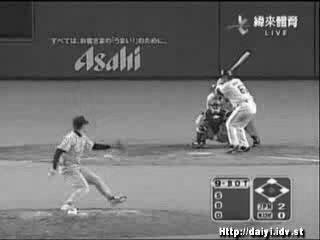

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [126, 100,  86],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 88,  62,  48],
        [ 84,  58,  44],
        [ 79,  53,  39],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
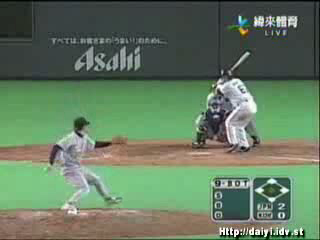

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 106, ..., 138, 157,  84],
       [114, 111, 109, ..., 137, 159,  87],
       [ 68,  64,  59, ...,  72,  95,  26]], dtype=uint8)
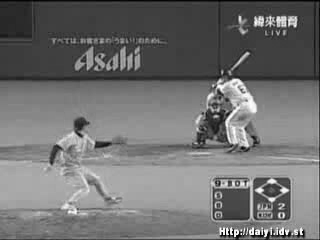

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[126, 100,  86],
        [126, 100,  86],
        [126, 100,  86],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[134, 108,  94],
        [131, 105,  91],
        [129, 103,  89],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 88,  62,  48],
        [ 84,  58,  44],
        [ 79,  53,  39],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
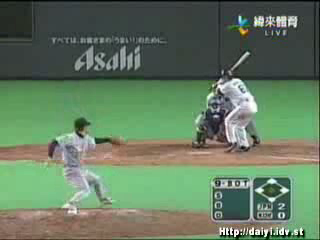

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [106, 106, 106, ..., 138, 157,  84],
       [114, 111, 109, ..., 137, 159,  87],
       [ 68,  64,  59, ...,  72,  95,  26]], dtype=uint8)
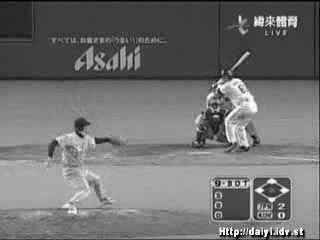

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
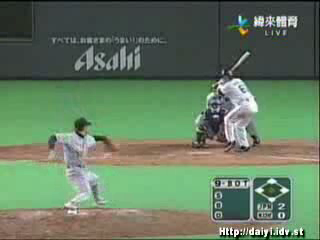

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
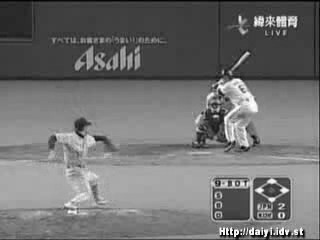

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
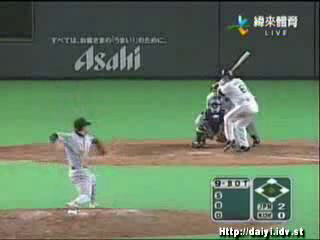

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
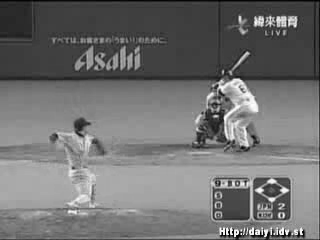

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
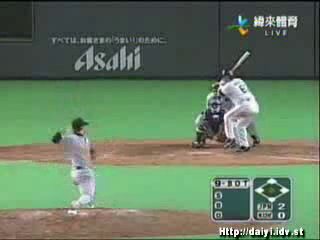

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
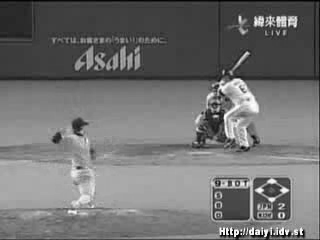

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
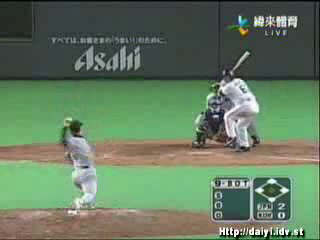

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
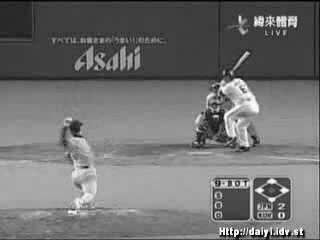

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
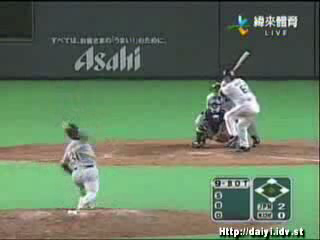

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
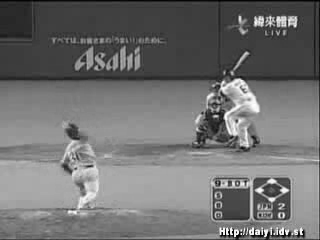

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
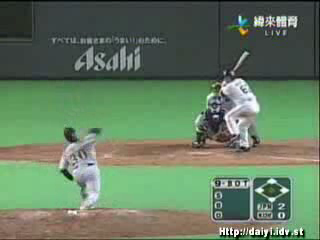

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
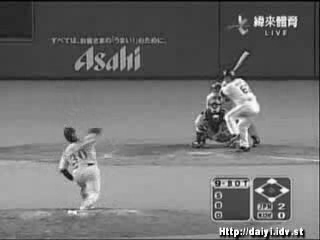

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
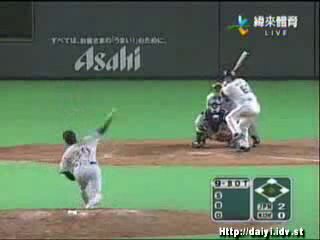

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
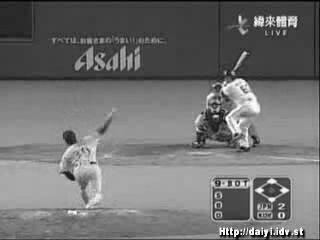

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
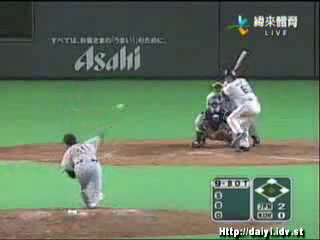

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
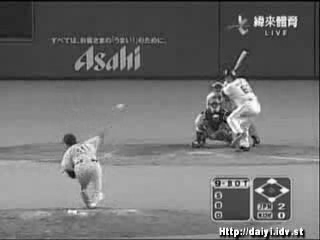

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[138, 112,  98],
        [136, 110,  96],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 90,  64,  50],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
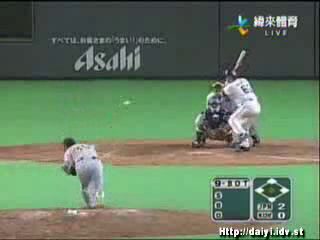

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [118, 116, 114, ..., 137, 159,  87],
       [ 74,  70,  65, ...,  72,  95,  26]], dtype=uint8)
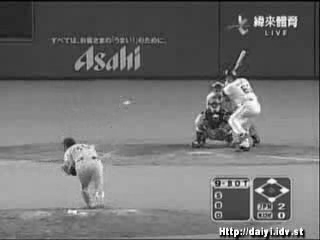

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
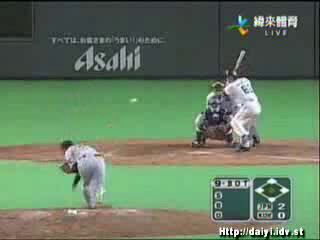

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
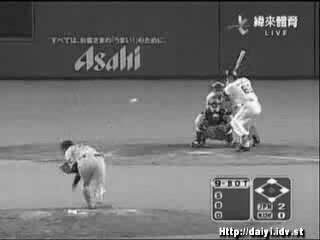

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
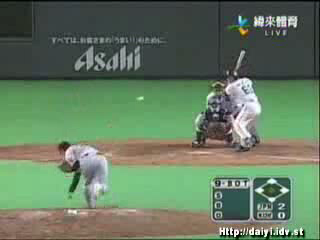

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
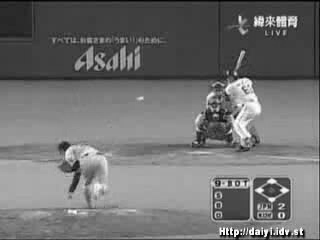

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
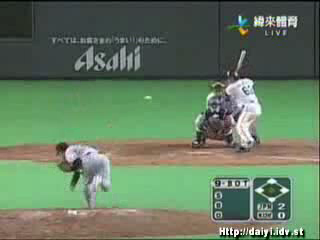

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
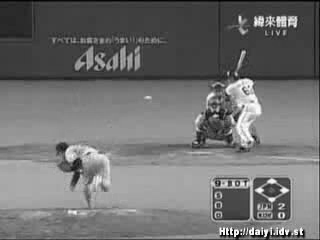

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
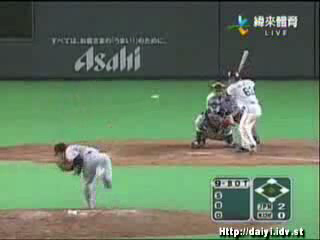

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
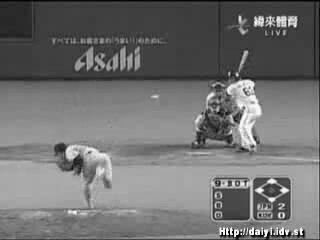

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
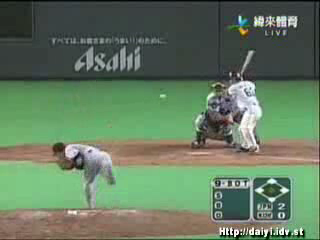

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
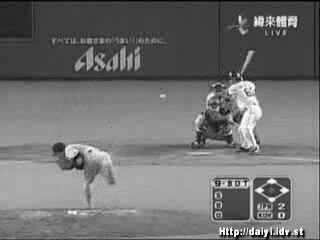

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
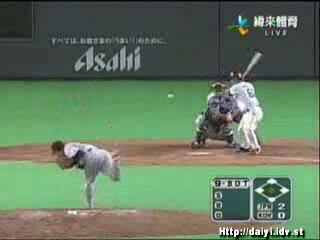

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
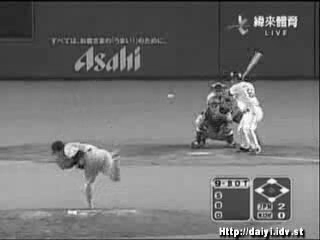

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
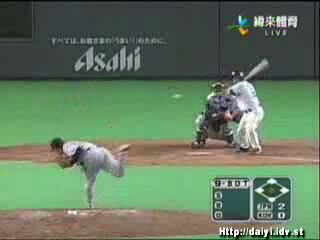

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
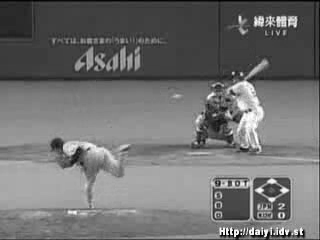

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[129, 103,  89],
        [129, 103,  89],
        [129, 103,  89],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[140, 114, 100],
        [137, 111,  97],
        [134, 108,  94],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 94,  68,  54],
        [ 91,  65,  51],
        [ 85,  59,  45],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
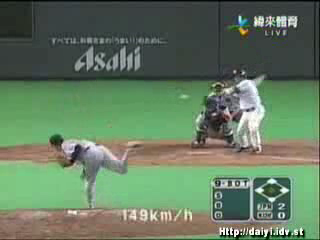

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [109, 109, 109, ..., 138, 157,  84],
       [120, 117, 114, ..., 137, 159,  87],
       [ 74,  71,  65, ...,  72,  95,  26]], dtype=uint8)
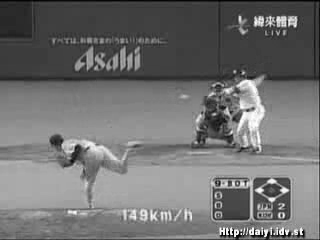

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[143, 117, 103],
        [141, 115, 101],
        [137, 111,  97],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 98,  72,  58],
        [ 94,  68,  54],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
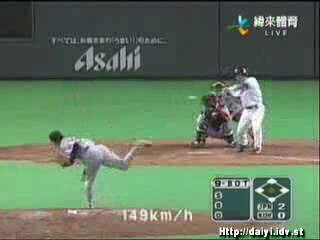

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [113, 113, 113, ..., 138, 157,  84],
       [123, 121, 117, ..., 137, 159,  87],
       [ 78,  74,  68, ...,  72,  95,  26]], dtype=uint8)
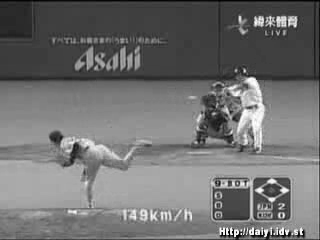

array([[[  0,   7,   0],
        [  0,   7,   0],
        [  0,   7,   0],
        ...,
        [  0,   5,   6],
        [  3,   9,  10],
        [  0,   0,   0]],

       [[ 21,  28,  21],
        [ 21,  28,  21],
        [ 21,  28,  21],
        ...,
        [ 27,  33,  34],
        [ 28,  34,  35],
        [  8,  14,  15]],

       [[ 39,  46,  39],
        [ 39,  46,  39],
        [ 39,  46,  39],
        ...,
        [ 57,  63,  64],
        [ 53,  59,  60],
        [ 27,  33,  34]],

       ...,

       [[133, 107,  93],
        [133, 107,  93],
        [133, 107,  93],
        ...,
        [111, 157, 110],
        [134, 175, 129],
        [ 61, 102,  56]],

       [[143, 117, 103],
        [141, 115, 101],
        [137, 111,  97],
        ...,
        [110, 156, 109],
        [136, 177, 131],
        [ 64, 105,  59]],

       [[ 98,  72,  58],
        [ 94,  68,  54],
        [ 88,  62,  48],
        ...,
        [ 45,  91,  44],
        [ 72, 113,  67],
        [  2,  43,   0]]], dtype=uint8)
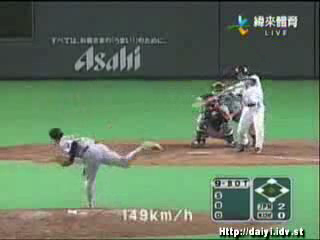

array([[  4,   4,   4, ...,   4,   7,   0],
       [ 25,  25,  25, ...,  31,  32,  12],
       [ 43,  43,  43, ...,  61,  57,  31],
       ...,
       [113, 113, 113, ..., 138, 157,  84],
       [123, 121, 117, ..., 137, 159,  87],
       [ 78,  74,  68, ...,  72,  95,  26]], dtype=uint8)
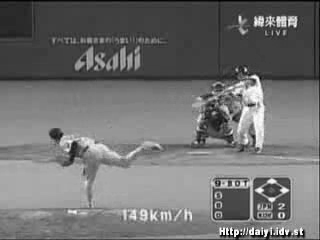

array([[[  2,   7,   6],
        [  2,   7,   6],
        [  2,   7,   6],
        ...,
        [  0,   0,   0],
        [  8,  10,  10],
        [  0,   0,   0]],

       [[ 23,  28,  27],
        [ 23,  28,  27],
        [ 23,  28,  27],
        ...,
        [ 28,  30,  30],
        [ 32,  34,  34],
        [ 11,  13,  13]],

       [[ 41,  46,  45],
        [ 41,  46,  45],
        [ 41,  46,  45],
        ...,
        [ 58,  60,  60],
        [ 56,  58,  58],
        [ 27,  29,  29]],

       ...,

       [[135, 113,  95],
        [135, 113,  95],
        [134, 112,  94],
        ...,
        [117, 163, 114],
        [129, 170, 122],
        [ 62, 103,  55]],

       [[138, 116,  98],
        [136, 114,  96],
        [133, 111,  93],
        ...,
        [115, 161, 112],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 96,  74,  56],
        [ 91,  69,  51],
        ...,
        [ 50,  96,  47],
        [ 67, 108,  60],
        [  2,  43,   0]]], dtype=uint8)
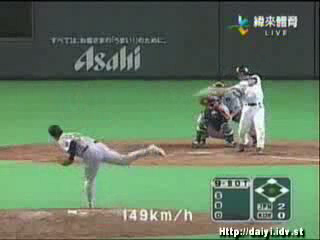

array([[  5,   5,   5, ...,   0,   9,   0],
       [ 26,  26,  26, ...,  29,  33,  12],
       [ 44,  44,  44, ...,  59,  57,  28],
       ...,
       [118, 118, 117, ..., 144, 152,  85],
       [121, 119, 116, ..., 142, 155,  88],
       [ 81,  79,  74, ...,  77,  90,  26]], dtype=uint8)
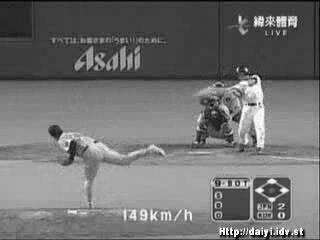

array([[[  2,   7,   6],
        [  2,   7,   6],
        [  2,   7,   6],
        ...,
        [  0,   0,   0],
        [  8,  10,  10],
        [  0,   0,   0]],

       [[ 23,  28,  27],
        [ 23,  28,  27],
        [ 23,  28,  27],
        ...,
        [ 28,  30,  30],
        [ 32,  34,  34],
        [ 11,  13,  13]],

       [[ 41,  46,  45],
        [ 41,  46,  45],
        [ 41,  46,  45],
        ...,
        [ 58,  60,  60],
        [ 56,  58,  58],
        [ 27,  29,  29]],

       ...,

       [[133, 111,  93],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [117, 163, 114],
        [129, 170, 122],
        [ 62, 103,  55]],

       [[135, 113,  95],
        [134, 112,  94],
        [131, 109,  91],
        ...,
        [115, 161, 112],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 96,  74,  56],
        [ 93,  71,  53],
        [ 89,  67,  49],
        ...,
        [ 50,  96,  47],
        [ 67, 108,  60],
        [  2,  43,   0]]], dtype=uint8)
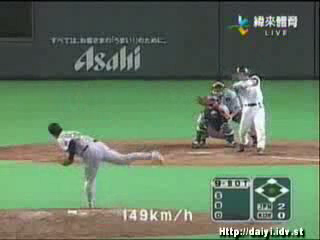

array([[  5,   5,   5, ...,   0,   9,   0],
       [ 26,  26,  26, ...,  29,  33,  12],
       [ 44,  44,  44, ...,  59,  57,  28],
       ...,
       [116, 116, 115, ..., 144, 152,  85],
       [118, 117, 114, ..., 142, 155,  88],
       [ 79,  76,  72, ...,  77,  90,  26]], dtype=uint8)
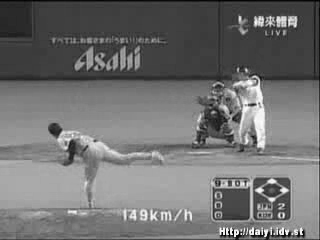

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
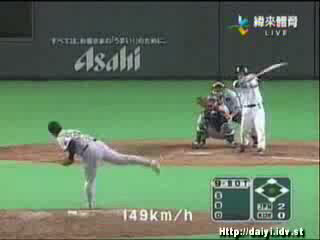

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
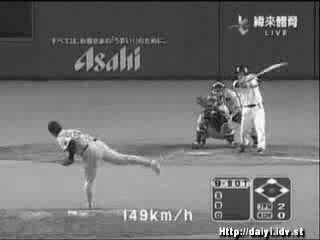

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
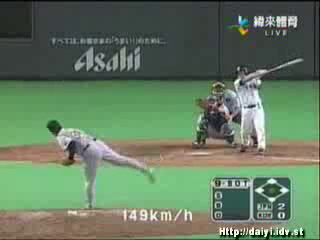

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
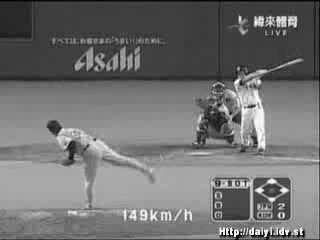

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
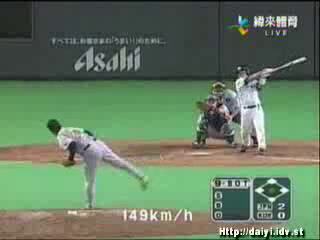

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
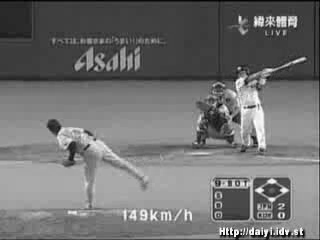

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
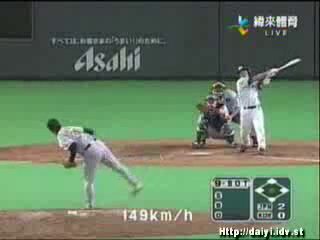

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
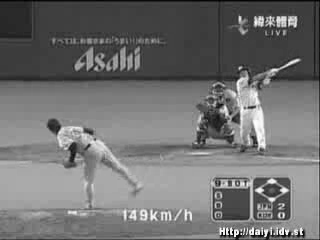

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
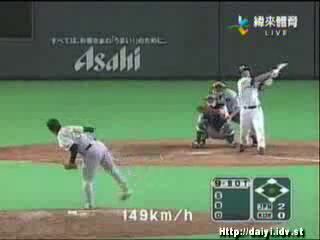

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
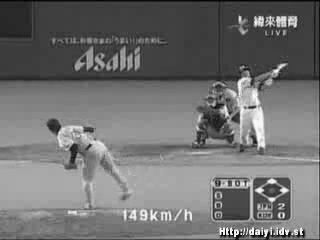

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
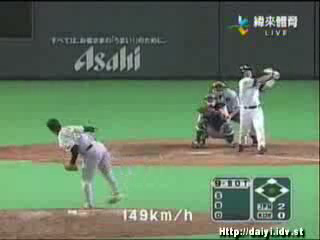

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
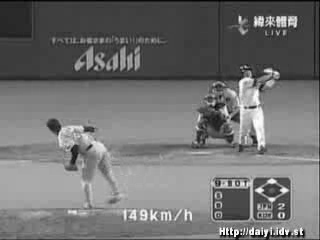

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
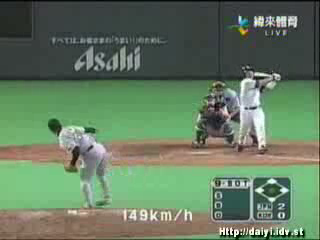

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
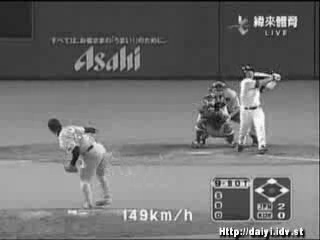

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
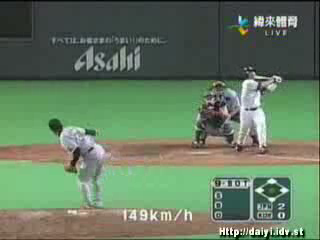

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
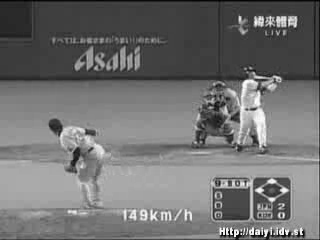

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
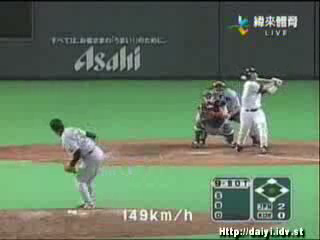

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
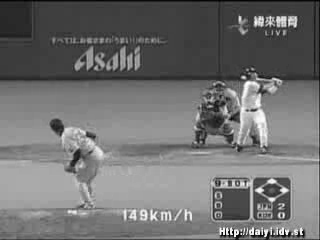

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[134, 112,  94],
        [133, 111,  93],
        [132, 110,  92],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[136, 114,  96],
        [133, 111,  93],
        [128, 106,  88],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 98,  76,  58],
        [ 92,  70,  52],
        [ 84,  62,  44],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
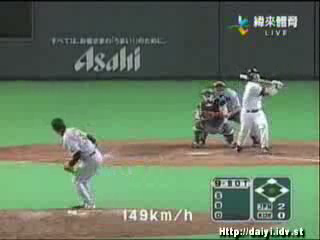

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [117, 116, 115, ..., 145, 152,  84],
       [119, 116, 111, ..., 144, 155,  88],
       [ 81,  75,  67, ...,  78,  89,  26]], dtype=uint8)
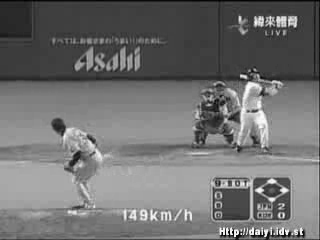

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[127, 105,  87],
        [126, 104,  86],
        [125, 103,  85],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[128, 106,  88],
        [125, 103,  85],
        [120,  98,  80],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 89,  67,  49],
        [ 83,  61,  43],
        [ 75,  53,  35],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
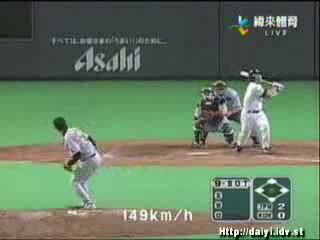

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [110, 109, 108, ..., 145, 152,  84],
       [111, 108, 103, ..., 144, 155,  88],
       [ 72,  66,  58, ...,  78,  89,  26]], dtype=uint8)
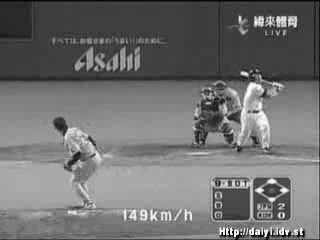

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[127, 105,  87],
        [126, 104,  86],
        [125, 103,  85],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[128, 106,  88],
        [125, 103,  85],
        [120,  98,  80],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 89,  67,  49],
        [ 83,  61,  43],
        [ 75,  53,  35],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
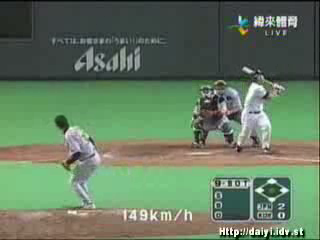

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [110, 109, 108, ..., 145, 152,  84],
       [111, 108, 103, ..., 144, 155,  88],
       [ 72,  66,  58, ...,  78,  89,  26]], dtype=uint8)
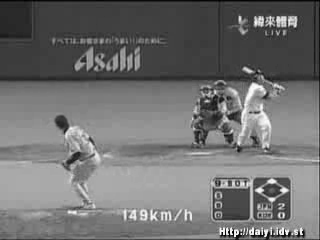

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[129, 107,  89],
        [128, 106,  88],
        [127, 105,  87],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[129, 107,  89],
        [126, 104,  86],
        [120,  98,  80],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 91,  69,  51],
        [ 85,  63,  45],
        [ 78,  56,  38],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
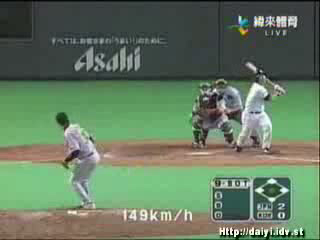

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [112, 111, 110, ..., 145, 152,  84],
       [112, 109, 103, ..., 144, 155,  88],
       [ 74,  68,  61, ...,  78,  89,  26]], dtype=uint8)
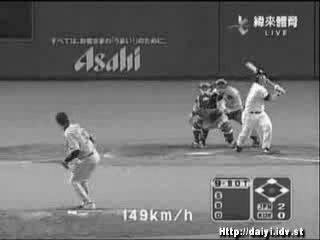

array([[[  1,   6,   5],
        [  1,   6,   5],
        [  1,   6,   5],
        ...,
        [  0,   0,   0],
        [  9,  11,  11],
        [  0,   0,   0]],

       [[ 22,  27,  26],
        [ 22,  27,  26],
        [ 22,  27,  26],
        ...,
        [ 30,  32,  32],
        [ 36,  38,  38],
        [ 13,  15,  15]],

       [[ 39,  44,  43],
        [ 39,  44,  43],
        [ 39,  44,  43],
        ...,
        [ 58,  60,  60],
        [ 58,  60,  60],
        [ 29,  31,  31]],

       ...,

       [[129, 107,  89],
        [128, 106,  88],
        [127, 105,  87],
        ...,
        [118, 164, 115],
        [129, 170, 122],
        [ 61, 102,  54]],

       [[129, 107,  89],
        [126, 104,  86],
        [120,  98,  80],
        ...,
        [117, 163, 114],
        [132, 173, 125],
        [ 65, 106,  58]],

       [[ 91,  69,  51],
        [ 85,  63,  45],
        [ 78,  56,  38],
        ...,
        [ 51,  97,  48],
        [ 66, 107,  59],
        [  2,  43,   0]]], dtype=uint8)
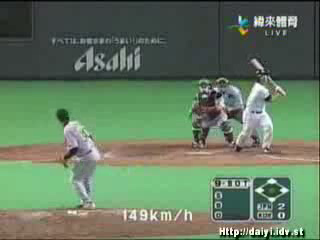

array([[  4,   4,   4, ...,   0,  10,   0],
       [ 25,  25,  25, ...,  31,  37,  14],
       [ 42,  42,  42, ...,  59,  59,  30],
       ...,
       [112, 111, 110, ..., 145, 152,  84],
       [112, 109, 103, ..., 144, 155,  88],
       [ 74,  68,  61, ...,  78,  89,  26]], dtype=uint8)
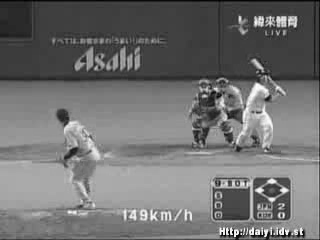

Finished playing video.


In [ ]:
# c) Play a sample of the downloaded video file
import cv2
# Corrected import statement
from IPython.display import display, clear_output
import time

# Choose a sample video file path from the downloaded data
# Replace this with the actual path to a video file you want to play
video_path = 'UCF101_subset/val/BaseballPitch/v_BaseballPitch_g17_c01.avi'

# Open the video file
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print(f"Error: Could not open video file {video_path}")
else:
    print(f"Playing video: {video_path}")
    try:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            # Convert the frame to RGB (OpenCV reads in BGR)
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            gray_frame1 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

            # Display the frame
            # clear_output(wait=True) # Uncomment this to clear previous frames
            display(frame_rgb)
            display(gray_frame1)

            # Optional: Add a small delay between frames to control playback speed
            # time.sleep(0.03) # Adjust the sleep time as needed

    finally:
        # Release the video capture object
        cap.release()
        print("Finished playing video.")

# Task
Convert the current Keras model for video classification into a Spiking Neural Network (SNN) without using convolutions.

## Research snn libraries/implementations

### Subtask:
Identify suitable Python libraries or methods for building SNNs within the Colab environment.


**Reasoning**:
To identify suitable Python libraries for building SNNs in a Colab environment, I will search for relevant libraries and briefly investigate their features and suitability. I will then summarize my findings.

